In [4]:
import numpy as np
import matplotlib.pyplot as plt
import pickle

from skimage import feature
from PIL import Image
from pathlib import Path

from utils import utils
from metrics import retrieval_distances
from metrics import retrieval_metrics
from preprocessing import pipelines

# LBP

In [80]:
N_POINTS = 8
RADIUS = 1
METHOD = 'uniform'
eps = 1e-6

In [81]:
def get_LBP_descriptor(greyscale_img: np.ndarray):
    lbp: np.ndarray = feature.local_binary_pattern(greyscale_img, N_POINTS, RADIUS, METHOD)
    #print(f'Max: {lbp.max()}')
    #print(f'Min: {lbp.min()}')
    #print(f'Unique: {np.unique(lbp)}')
    counts, _ = np.histogram(lbp, bins=N_POINTS + 2, range=(0, N_POINTS + 2))
    #print(counts)
    return counts / (counts.sum() + eps)

In [86]:
def get_multitile_LBP_descriptor(greyscale_img: np.ndarray, tiles: int = 3):
    h, w = greyscale_img.shape
    i_step = h / tiles
    j_step = w / tiles

    feature_vector = np.array([])
    for i in range(1, tiles+1):
        for j in range(1, tiles+1):
            tile_feature = get_LBP_descriptor(greyscale_img[round(i_step * (i-1)):round(i_step * i), round(j_step * (j-1)):round(j_step * j)])
            feature_vector = np.concatenate((feature_vector, tile_feature))
    return feature_vector

In [83]:
def load_image(path):
    return np.array(Image.open(path))

In [84]:
def convert_to_greyscale(img):
    return np.array(Image.fromarray(img).convert('L'))

    #return np.dot(img[...,:3], [0.2989, 0.5870, 0.1140])
    
    #img = utils.image2tensor(img) /255
    #print(img)
    #return utils.convert2gray(img)

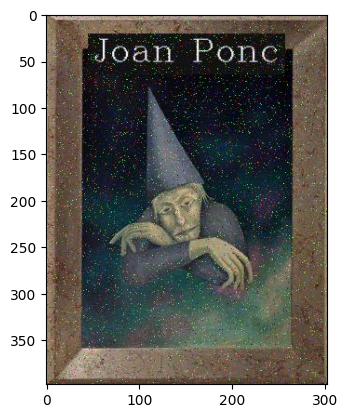

In [12]:
test_img = load_image('../data/qsd1_w3/00001.jpg')
plt.imshow(test_img)

uint8


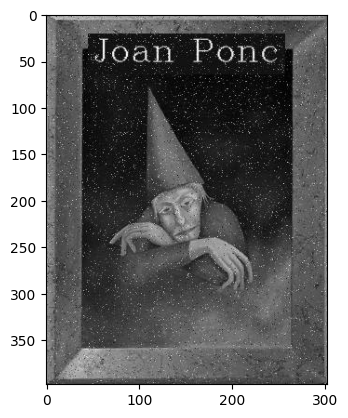

In [37]:
gscl_img = convert_to_greyscale(test_img)
plt.imshow(gscl_img, cmap=plt.colormaps.get_cmap('gray'))

In [36]:
get_LBP_descriptor(gscl_img)

Max: 9.0
Min: 0.0
Unique: [0. 1. 2. 3. 4. 5. 6. 7. 8. 9.]
[14954 12863  5739  7727  7137  7114  6558 13000 18913 26589]


array([0.12400285, 0.10666368, 0.04758943, 0.0640745 , 0.05918205,
       0.05899133, 0.05438081, 0.10779972, 0.15683201, 0.22048361])

In [43]:
flat_img = np.ones((200, 200), dtype=np.uint8)
get_multitile_LBP_descriptor(flat_img)

Max: 8.0
Min: 3.0
Unique: [3. 5. 8.]
[   0    0    0    4    0  260    0    0 4225    0]
[0.00000000e+00 0.00000000e+00 0.00000000e+00 8.91067053e-04
 0.00000000e+00 5.79193584e-02 0.00000000e+00 0.00000000e+00
 9.41189574e-01 0.00000000e+00]
Max: 8.0
Min: 3.0
Unique: [3. 5. 8.]
[   0    0    0    4    0  258    0    0 4160    0]
[0.00000000e+00 0.00000000e+00 0.00000000e+00 9.04568069e-04
 0.00000000e+00 5.83446404e-02 0.00000000e+00 0.00000000e+00
 9.40750791e-01 0.00000000e+00]
Max: 8.0
Min: 3.0
Unique: [3. 5. 8.]
[   0    0    0    4    0  260    0    0 4225    0]
[0.00000000e+00 0.00000000e+00 0.00000000e+00 8.91067053e-04
 0.00000000e+00 5.79193584e-02 0.00000000e+00 0.00000000e+00
 9.41189574e-01 0.00000000e+00]
Max: 8.0
Min: 3.0
Unique: [3. 5. 8.]
[   0    0    0    4    0  258    0    0 4160    0]
[0.00000000e+00 0.00000000e+00 0.00000000e+00 9.04568069e-04
 0.00000000e+00 5.83446404e-02 0.00000000e+00 0.00000000e+00
 9.40750791e-01 0.00000000e+00]
Max: 8.0
Min: 3.0
Unique: [3

array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 8.91067053e-04,
       0.00000000e+00, 5.79193584e-02, 0.00000000e+00, 0.00000000e+00,
       9.41189574e-01, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 9.04568069e-04, 0.00000000e+00, 5.83446404e-02,
       0.00000000e+00, 0.00000000e+00, 9.40750791e-01, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 8.91067053e-04,
       0.00000000e+00, 5.79193584e-02, 0.00000000e+00, 0.00000000e+00,
       9.41189574e-01, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 9.04568069e-04, 0.00000000e+00, 5.83446404e-02,
       0.00000000e+00, 0.00000000e+00, 9.40750791e-01, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 9.18273645e-04,
       0.00000000e+00, 5.87695133e-02, 0.00000000e+00, 0.00000000e+00,
       9.40312213e-01, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 9.04568069e-04, 0.00000000e+00, 5.83446404e-02,
      

## Database descriptors

In [45]:
descriptor_db = {}
for file in utils.read_bbdd('../data/BBDD/'):
    grscl_img = convert_to_greyscale(np.array(Image.open(file)))
    descriptor_db[file.name] = get_multitile_LBP_descriptor(grscl_img)

Max: 9.0
Min: 0.0
Unique: [0. 1. 2. 3. 4. 5. 6. 7. 8. 9.]
[ 4403  7819  3403 12144 10139 18013  6545 12932 27624 11890]
[0.03831628 0.06804337 0.02961397 0.10568087 0.08823273 0.15675473
 0.05695663 0.11253829 0.24039265 0.10347048]
Max: 9.0
Min: 0.0
Unique: [0. 1. 2. 3. 4. 5. 6. 7. 8. 9.]
[ 3523  6756  2578 11131  8251 17642  4457 12847 37556 10171]
[0.03065824 0.05879282 0.02243456 0.09686543 0.07180277 0.15352618
 0.0387862  0.11179859 0.326824   0.08851121]
Max: 9.0
Min: 0.0
Unique: [0. 1. 2. 3. 4. 5. 6. 7. 8. 9.]
[ 4308  8260  2898 10104 11564 17088  4837 11779 32183 11891]
[0.03748956 0.07188109 0.0252193  0.08792815 0.10063353 0.1487051
 0.04209308 0.10250453 0.28006649 0.10347918]
Max: 9.0
Min: 0.0
Unique: [0. 1. 2. 3. 4. 5. 6. 7. 8. 9.]
[ 3848  8287  2928 10275 14149 20164  5671 10613 26164 12813]
[0.03348649 0.07211605 0.02548037 0.08941625 0.123129   0.17547341
 0.04935081 0.09235763 0.22768727 0.11150272]
Max: 9.0
Min: 0.0
Unique: [0. 1. 2. 3. 4. 5. 6. 7. 8. 9.]
[ 4442  840

In [61]:
descriptor_db.keys()

dict_keys(['bbdd_00000.jpg', 'bbdd_00001.jpg', 'bbdd_00002.jpg', 'bbdd_00003.jpg', 'bbdd_00004.jpg', 'bbdd_00005.jpg', 'bbdd_00006.jpg', 'bbdd_00007.jpg', 'bbdd_00008.jpg', 'bbdd_00009.jpg', 'bbdd_00010.jpg', 'bbdd_00011.jpg', 'bbdd_00012.jpg', 'bbdd_00013.jpg', 'bbdd_00014.jpg', 'bbdd_00015.jpg', 'bbdd_00016.jpg', 'bbdd_00017.jpg', 'bbdd_00018.jpg', 'bbdd_00019.jpg', 'bbdd_00020.jpg', 'bbdd_00021.jpg', 'bbdd_00022.jpg', 'bbdd_00023.jpg', 'bbdd_00024.jpg', 'bbdd_00025.jpg', 'bbdd_00026.jpg', 'bbdd_00027.jpg', 'bbdd_00028.jpg', 'bbdd_00029.jpg', 'bbdd_00030.jpg', 'bbdd_00031.jpg', 'bbdd_00032.jpg', 'bbdd_00033.jpg', 'bbdd_00034.jpg', 'bbdd_00035.jpg', 'bbdd_00036.jpg', 'bbdd_00037.jpg', 'bbdd_00038.jpg', 'bbdd_00039.jpg', 'bbdd_00040.jpg', 'bbdd_00041.jpg', 'bbdd_00042.jpg', 'bbdd_00043.jpg', 'bbdd_00044.jpg', 'bbdd_00045.jpg', 'bbdd_00046.jpg', 'bbdd_00047.jpg', 'bbdd_00048.jpg', 'bbdd_00049.jpg', 'bbdd_00050.jpg', 'bbdd_00051.jpg', 'bbdd_00052.jpg', 'bbdd_00053.jpg', 'bbdd_00054.jpg',

In [49]:
test_img = convert_to_greyscale(np.array(Image.open('../data/qsd1_w3/00001.jpg')))
query_descriptor = get_multitile_LBP_descriptor(test_img)
utils.retriev_image(descriptor_db, query_descriptor, retrieval_distances.histogram_intersection)

[0.12908509 0.10958088 0.04555944 0.06402144 0.05836373 0.06171369
 0.04913273 0.10399762 0.15789474 0.22065064]
[0.13265838 0.10779424 0.04168838 0.06059704 0.0489094  0.05158937
 0.04474056 0.10206209 0.18156778 0.22839276]
[0.12997841 0.1082409  0.04369835 0.06469143 0.05188714 0.05635376
 0.04853718 0.10600759 0.16608353 0.2245217 ]
[0.12526253 0.10756076 0.0459796  0.06210621 0.05835584 0.06053105
 0.04972997 0.110036   0.15669067 0.22374737]
[0.11941194 0.09915992 0.05468047 0.07110711 0.08168317 0.07080708
 0.05490549 0.09975998 0.14161416 0.20687069]
[0.12706271 0.10943594 0.05070507 0.05948095 0.05528053 0.05618062
 0.05378038 0.10906091 0.15586559 0.22314731]
[0.11769523 0.10913422 0.05449267 0.07042358 0.06171369 0.07280578
 0.0581404  0.10444428 0.13928385 0.2118663 ]
[0.1255118  0.109432   0.05211047 0.0615648  0.05881039 0.06059704
 0.05962927 0.10697536 0.14553711 0.21983176]
[0.11977965 0.11025087 0.05211047 0.06804139 0.06424477 0.06752029
 0.06379811 0.10660314 0.1339

[(8.114446809597771, 34),
 (7.8015164369227525, 282),
 (7.768862944039001, 216),
 (7.757199765646263, 238),
 (7.752063759327845, 11),
 (7.7231423113068, 199),
 (7.59457504682891, 92),
 (7.514844496346761, 21),
 (7.495459976643534, 80),
 (7.458752552925842, 25),
 (7.456103460589027, 33),
 (7.428249650071323, 202),
 (7.426052755405198, 121),
 (7.419634196820289, 10),
 (7.3390406087062905, 153),
 (7.328004385201403, 28),
 (7.312011631725686, 83),
 (7.2875877530952975, 186),
 (7.261166093777794, 242),
 (7.259518720583255, 254),
 (7.251258879774617, 227),
 (7.242518802810864, 26),
 (7.236028944618633, 214),
 (7.226582176415299, 110),
 (7.224137781795889, 131),
 (7.205345051805198, 231),
 (7.205344987012437, 165),
 (7.1737936656584465, 74),
 (7.166916409189635, 115),
 (7.1600078128532, 278),
 (7.137817256733189, 261),
 (7.1377392186968205, 91),
 (7.122962144164357, 266),
 (7.110629093692233, 138),
 (7.089192445765716, 191),
 (7.0836674292405455, 50),
 (7.083256405800958, 59),
 (7.07858888343

In [60]:
for file in Path('../data/BBDD/').glob('*.txt'):
    if 'Joan Ponc' in file.read_text('latin-1'):
        print(file)

..\data\BBDD\bbdd_00090.txt
..\data\BBDD\bbdd_00091.txt
..\data\BBDD\bbdd_00101.txt
..\data\BBDD\bbdd_00182.txt
..\data\BBDD\bbdd_00252.txt
..\data\BBDD\bbdd_00262.txt


In [9]:
with open('../data/qsd1_w3/gt_corresps.pkl', 'rb') as f:
    gt = pickle.load(f)
print(gt)

[[92], [262], [260], [13], [212], [180], [94], [100], [280], [113], [211], [6], [236], [277], [182], [25], [90], [193], [286], [155], [272], [258], [219], [7], [35], [155], [21], [251], [22], [32]]


In [68]:
query_descriptors = {}
for img_path in Path('../data/qsd1_w3/').glob('*.jpg'):
    test_img = convert_to_greyscale(np.array(Image.open(img_path)))
    query_descriptors[img_path.name] = get_multitile_LBP_descriptor(test_img)

[0.13355787 0.10655236 0.04145744 0.06282915 0.04874464 0.05101041
 0.04433558 0.11236987 0.16631966 0.23282303]
[0.13201137 0.11446751 0.04423029 0.05911787 0.04657771 0.05003706
 0.04268594 0.10742525 0.16950828 0.23393872]
[0.12878138 0.10183711 0.04445805 0.07066748 0.06031843 0.06221678
 0.04807103 0.10716473 0.15492958 0.22155542]
[0.13962381 0.11273512 0.04070305 0.0511255  0.03940796 0.04335492
 0.04341659 0.11279679 0.17409806 0.24273821]
[0.13612044 0.11148438 0.04690805 0.05306706 0.04354859 0.04473062
 0.04634814 0.1100535  0.17120816 0.23653104]
[0.12636448 0.11032994 0.04865865 0.06339809 0.05346901 0.05149553
 0.05235893 0.10835646 0.16164046 0.22392846]
[0.13429271 0.11077771 0.04329455 0.05566442 0.04268218 0.04617269
 0.04402939 0.11034905 0.17856705 0.23417024]
[0.13411169 0.11008154 0.04311836 0.06060044 0.0458982  0.04806029
 0.04552755 0.10569558 0.17333828 0.23356808]
[0.13227189 0.10936926 0.04409063 0.06178812 0.05015309 0.0531537
 0.0458665  0.10740968 0.16778

[[34, 282, 238, 11, 216, 199, 121, 92, 33, 10],
 [34, 282, 216, 238, 11, 199, 92, 21, 80, 25],
 [34, 282, 11, 238, 216, 199, 92, 21, 80, 25],
 [52, 158, 184, 144, 285, 279, 206, 223, 100, 125],
 [212, 190, 142, 43, 32, 76, 13, 249, 133, 174],
 [112, 226, 109, 284, 4, 98, 273, 142, 129, 252],
 [34, 282, 11, 238, 216, 199, 92, 21, 33, 25],
 [194, 75, 189, 100, 24, 114, 229, 2, 141, 204],
 [34, 11, 216, 199, 282, 92, 238, 21, 10, 202],
 [281, 58, 228, 225, 136, 211, 272, 24, 192, 277],
 [211, 281, 228, 277, 222, 280, 158, 176, 272, 206],
 [34, 282, 238, 11, 216, 199, 92, 121, 33, 21],
 [194, 236, 189, 45, 2, 24, 47, 204, 229, 100],
 [34, 282, 238, 11, 216, 199, 92, 21, 80, 33],
 [182, 240, 0, 18, 270, 236, 267, 229, 134, 101],
 [25, 202, 221, 143, 110, 242, 131, 157, 127, 278],
 [34, 216, 11, 282, 199, 92, 238, 21, 202, 25],
 [34, 11, 216, 282, 199, 92, 21, 238, 202, 25],
 [239, 63, 60, 193, 119, 259, 135, 103, 218, 286],
 [4, 5, 112, 185, 98, 226, 142, 252, 235, 66],
 [34, 282, 216, 11, 

In [72]:
response = pipelines.generate_K_response(descriptors_bdr=descriptor_db, descriptors_queries=query_descriptors, sim_func=retrieval_distances.histogram_intersection, k=10)
print(f'mAP@10: {retrieval_metrics.mapk(gt, response, k=10)}')
print(f'mAP@5: {retrieval_metrics.mapk(gt, response, k=5)}')
print(f'mAP@1: {retrieval_metrics.mapk(gt, response, k=1)}')

mAP@10: 0.22392857142857145
mAP@5: 0.20833333333333334
mAP@1: 0.16666666666666666


# Gabor

In [2]:
from skimage.filters import gabor_kernel
from scipy import ndimage as ndi

In [64]:
kernels = []
for i_theta in range(4):
    theta = i_theta * np.pi / 4
    for sigma in (1, 3):
        for frequency in (0.1, 0.25):
            kernel = np.real(gabor_kernel(frequency, theta=theta,
                                          sigma_x=sigma, sigma_y=sigma))
            kernels.append(kernel)

def compute_gabor_features(image):
    return np.array((image.mean(), image.var()))

def get_multitile_gabor_features(img: np.ndarray, tiles: int = 8):
    feats = np.zeros((len(kernels), 2), dtype=np.double)

    h, w, channels = img.shape
    i_step = h / tiles
    j_step = w / tiles

    feature_vector = np.array([])
    for k, kernel in enumerate(kernels):
        for c in range(channels):
            filtered = ndi.convolve(img[..., c], kernel, mode='wrap')
            for i in range(1, tiles+1):
                for j in range(1, tiles+1):
                    tile_feature = compute_gabor_features(filtered[round(i_step * (i-1)):round(i_step * i), round(j_step * (j-1)):round(j_step * j)])
                    feature_vector = np.concatenate((feature_vector, tile_feature))
    return feature_vector

In [67]:
len(kernels)

8

In [65]:
descriptor_db = {}
for file in utils.read_bbdd('../data/BBDD/'):
    img = np.array(Image.open(file))
    descriptor_db[file.name] = get_multitile_gabor_features(img, 8)
    print(file)
with open('../data/BBDD/descriptors/gabor_multi_dir8_sigma3_f01.pkl', 'wb') as f:
    pickle.dump(descriptor_db, f)

..\data\BBDD\bbdd_00000.jpg
..\data\BBDD\bbdd_00001.jpg
..\data\BBDD\bbdd_00002.jpg
..\data\BBDD\bbdd_00003.jpg
..\data\BBDD\bbdd_00004.jpg
..\data\BBDD\bbdd_00005.jpg
..\data\BBDD\bbdd_00006.jpg
..\data\BBDD\bbdd_00007.jpg
..\data\BBDD\bbdd_00008.jpg
..\data\BBDD\bbdd_00009.jpg
..\data\BBDD\bbdd_00010.jpg
..\data\BBDD\bbdd_00011.jpg
..\data\BBDD\bbdd_00012.jpg
..\data\BBDD\bbdd_00013.jpg
..\data\BBDD\bbdd_00014.jpg
..\data\BBDD\bbdd_00015.jpg
..\data\BBDD\bbdd_00016.jpg
..\data\BBDD\bbdd_00017.jpg
..\data\BBDD\bbdd_00018.jpg
..\data\BBDD\bbdd_00019.jpg
..\data\BBDD\bbdd_00020.jpg
..\data\BBDD\bbdd_00021.jpg
..\data\BBDD\bbdd_00022.jpg
..\data\BBDD\bbdd_00023.jpg
..\data\BBDD\bbdd_00024.jpg
..\data\BBDD\bbdd_00025.jpg
..\data\BBDD\bbdd_00026.jpg
..\data\BBDD\bbdd_00027.jpg
..\data\BBDD\bbdd_00028.jpg
..\data\BBDD\bbdd_00029.jpg
..\data\BBDD\bbdd_00030.jpg
..\data\BBDD\bbdd_00031.jpg
..\data\BBDD\bbdd_00032.jpg
..\data\BBDD\bbdd_00033.jpg
..\data\BBDD\bbdd_00034.jpg
..\data\BBDD\bbdd_00

In [68]:
query_descriptors = {}
for img_path in Path('../data/qsd1_w3/').glob('*.jpg'):
    test_img = np.array(Image.open(img_path))
    query_descriptors[img_path.name] = get_multitile_gabor_features(test_img, 8)
    print(img_path)

..\data\qsd1_w3\00000.jpg
..\data\qsd1_w3\00001.jpg
..\data\qsd1_w3\00002.jpg
..\data\qsd1_w3\00003.jpg
..\data\qsd1_w3\00004.jpg
..\data\qsd1_w3\00005.jpg
..\data\qsd1_w3\00006.jpg
..\data\qsd1_w3\00007.jpg
..\data\qsd1_w3\00008.jpg
..\data\qsd1_w3\00009.jpg
..\data\qsd1_w3\00010.jpg
..\data\qsd1_w3\00011.jpg
..\data\qsd1_w3\00012.jpg
..\data\qsd1_w3\00013.jpg
..\data\qsd1_w3\00014.jpg
..\data\qsd1_w3\00015.jpg
..\data\qsd1_w3\00016.jpg
..\data\qsd1_w3\00017.jpg
..\data\qsd1_w3\00018.jpg
..\data\qsd1_w3\00019.jpg
..\data\qsd1_w3\00020.jpg
..\data\qsd1_w3\00021.jpg
..\data\qsd1_w3\00022.jpg
..\data\qsd1_w3\00023.jpg
..\data\qsd1_w3\00024.jpg
..\data\qsd1_w3\00025.jpg
..\data\qsd1_w3\00026.jpg
..\data\qsd1_w3\00027.jpg
..\data\qsd1_w3\00028.jpg
..\data\qsd1_w3\00029.jpg


In [60]:
with open('../data/BBDD/descriptors/gabor_multi_8.pkl', 'rb') as f:
    descriptor_db = pickle.load(f)

In [69]:
response = pipelines.generate_K_response(descriptors_bdr=descriptor_db, descriptors_queries=query_descriptors, sim_func=retrieval_distances.histogram_intersection, k=10)
print(f'mAP@10: {retrieval_metrics.mapk(gt, response, k=10)}')
print(f'mAP@5: {retrieval_metrics.mapk(gt, response, k=5)}')
print(f'mAP@1: {retrieval_metrics.mapk(gt, response, k=1)}')

mAP@10: 0.05
mAP@5: 0.05
mAP@1: 0.03333333333333333


In [12]:
with open('../data/BBDD/descriptors/gabor_multi.pkl', 'wb') as f:
    pickle.dump(descriptor_db, f)

In [24]:
import cv2
from scipy.signal import convolve2d

In [72]:
def estimate_noise(I):

    H, W = I.shape

    M = [[1, -2, 1],
       [-2, 4, -2],
       [1, -2, 1]]

    sigma = np.sum(np.sum(np.absolute(convolve2d(I, M))))
    sigma = sigma * np.sqrt(0.5 * np.pi) / (6 * (W-2) * (H-2))

    return sigma

In [73]:
def CDenoissing(image):
    (r, g, b) = cv2.split(image)

    b_blur = cv2.medianBlur(b, 3)
    g_blur = cv2.medianBlur(g, 3)
    r_blur = cv2.medianBlur(r, 3)

    b_denoise = cv2.fastNlMeansDenoising(b_blur, 3, 7, 21)
    g_denoise = cv2.fastNlMeansDenoising(g_blur, 3, 7, 21)
    r_denoise = cv2.fastNlMeansDenoising(r_blur, 3, 7, 21)

    enhanced = cv2.merge((r_denoise, g_denoise, b_denoise))
    return enhanced

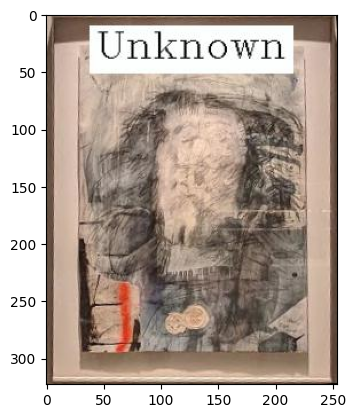

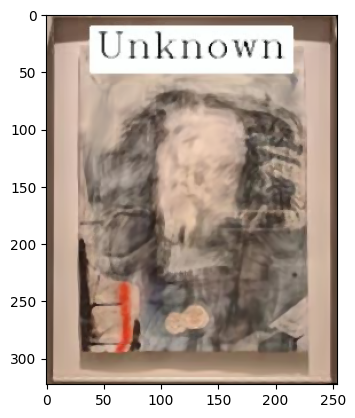

In [79]:
image = np.array(Image.open('../data/qsd1_w3/00004.jpg'))
plt.imshow(image)
plt.show()
if estimate_noise(convert_to_greyscale(image)) > 1:
        image = CDenoissing(image)
        plt.imshow(image)
        plt.show()

In [ ]:
query_descriptors = {}
for img_path in Path('../data/qsd1_w3/').glob('*.jpg'):
    image = np.array(Image.open(img_path))

    if estimate_noise(convert_to_greyscale(image)) > 1:
        image = CDenoissing(image)

    query_descriptors[img_path.name] = get_multitile_gabor_features(test_img)
    print(img_path)

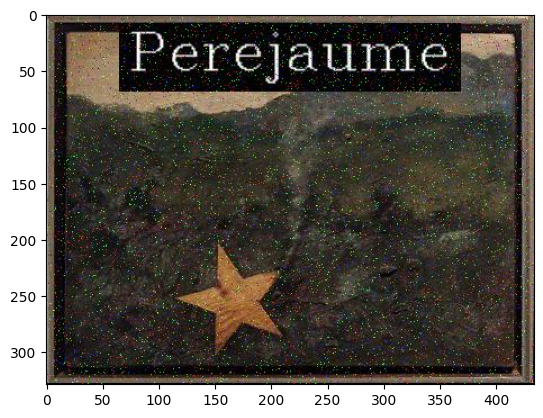

In [113]:
test_img = load_image('../data/qsd1_w3/00029.jpg')
plt.imshow(test_img)

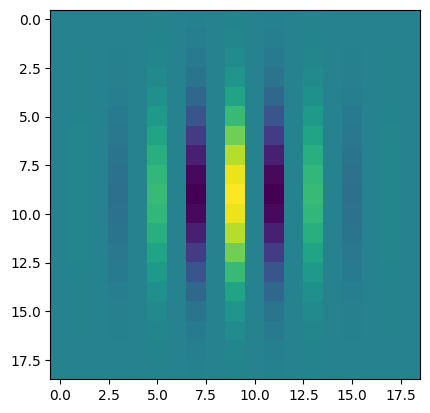

In [41]:
plt.imshow(kernels[3])

[[143 135 116 ... 155 148 156]
 [140 128 107 ... 144 144 154]
 [131 116  93 ... 129 136 147]
 ...
 [123 114  95 ... 103 113 105]
 [ 95  91  80 ...  87 101  97]
 [ 74  72  65 ...  73  86  85]]
uint8
[0.0, 1, 0.1]


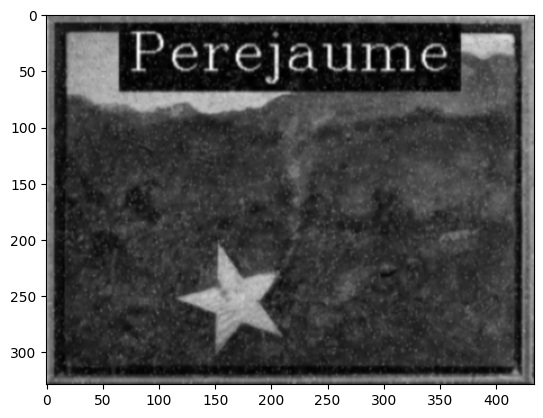

[[57 53 36 ... 55 40 71]
 [59 50 31 ... 48 42 70]
 [60 44 25 ... 41 43 66]
 ...
 [52 43 35 ... 32 57 19]
 [39 32 34 ... 27 50 22]
 [30 25 30 ... 24 42 22]]
uint8
[0.0, 1, 0.25]


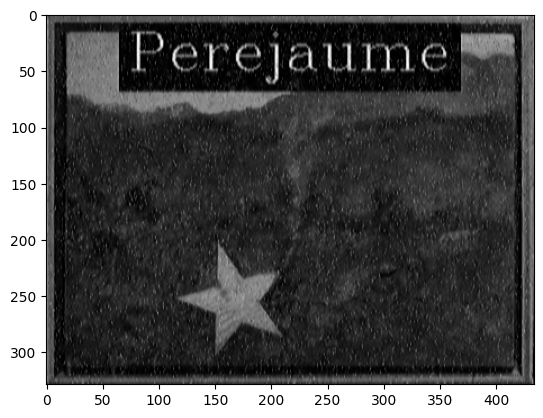

[[ 0  9  0 ... 14  0 40]
 [ 4  8  0 ...  8  0 34]
 [11  2  0 ...  4  0 25]
 ...
 [11  0  8 ...  0 48  0]
 [13  0 16 ...  0 38  0]
 [13  0 17 ...  0 28  0]]
uint8
[0.0, 1, 0.5]


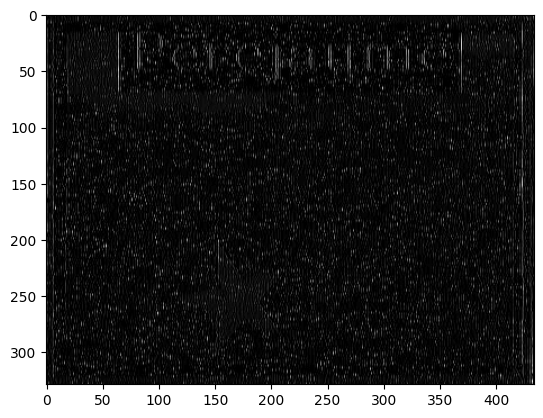

[[171 162 143 ... 190 184 187]
 [165 154 133 ... 178 178 184]
 [153 139 117 ... 159 166 174]
 ...
 [146 137 116 ... 125 134 132]
 [114 109  96 ... 106 119 119]
 [ 89  86  77 ...  88 102 104]]
uint8
[0.0, 1, 1]


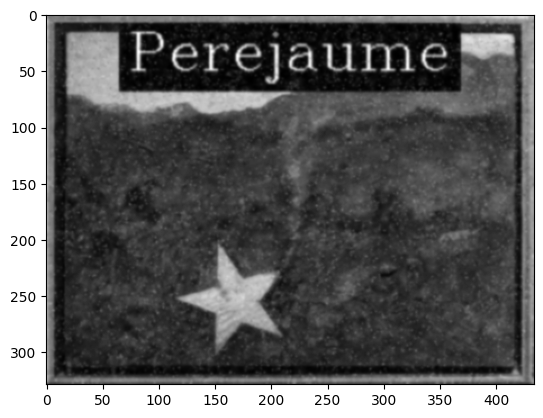

[[171 162 143 ... 190 184 187]
 [165 154 133 ... 178 178 184]
 [153 139 117 ... 159 166 174]
 ...
 [146 137 116 ... 125 134 132]
 [114 109  96 ... 106 119 119]
 [ 89  86  77 ...  88 102 104]]
uint8
[0.0, 1, 10]


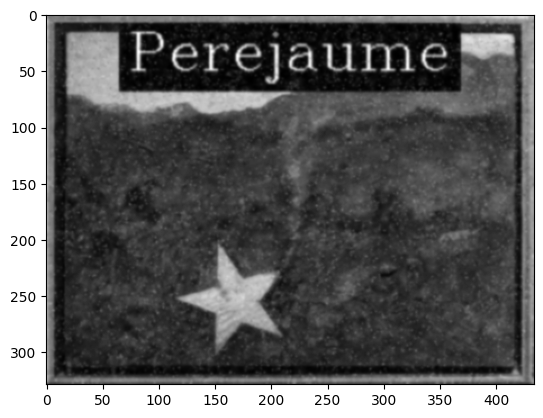

[[37 34 25 ... 25 25 26]
 [37 34 25 ... 25 25 26]
 [38 34 25 ... 25 25 25]
 ...
 [35 32 23 ... 23 26 27]
 [34 31 22 ... 23 27 28]
 [34 31 22 ... 23 27 28]]
uint8
[0.0, 3, 0.1]


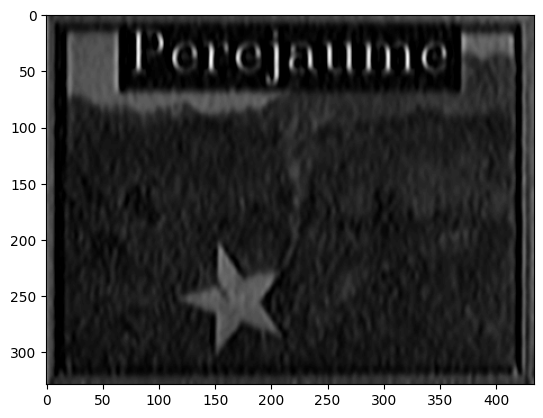

[[8 1 0 ... 0 0 4]
 [8 1 0 ... 0 0 4]
 [8 2 0 ... 0 0 3]
 ...
 [2 1 0 ... 7 0 0]
 [2 1 0 ... 6 0 0]
 [2 1 0 ... 6 0 0]]
uint8
[0.0, 3, 0.25]


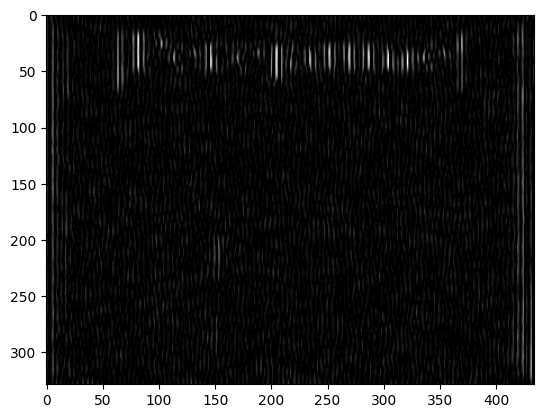

[[ 0  0  1 ...  5  0  7]
 [ 0  0  1 ...  5  0  6]
 [ 1  0  1 ...  4  0  5]
 ...
 [ 5  0  5 ...  0 19  0]
 [ 6  0  5 ...  0 21  0]
 [ 6  0  5 ...  0 21  0]]
uint8
[0.0, 3, 0.5]


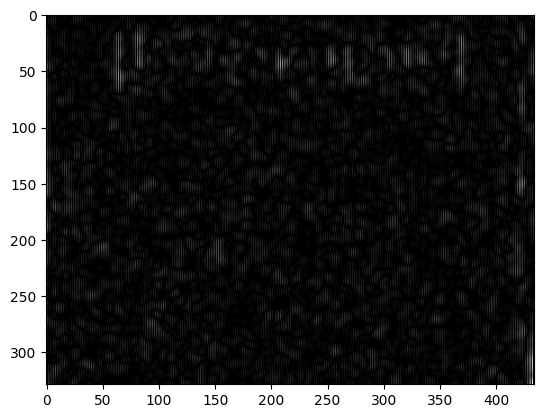

[[133 132 130 ... 170 169 168]
 [134 133 130 ... 169 167 167]
 [134 133 130 ... 165 164 163]
 ...
 [113 111 108 ... 106 109 110]
 [110 109 105 ... 105 108 109]
 [109 108 104 ... 105 108 109]]
uint8
[0.0, 3, 1]


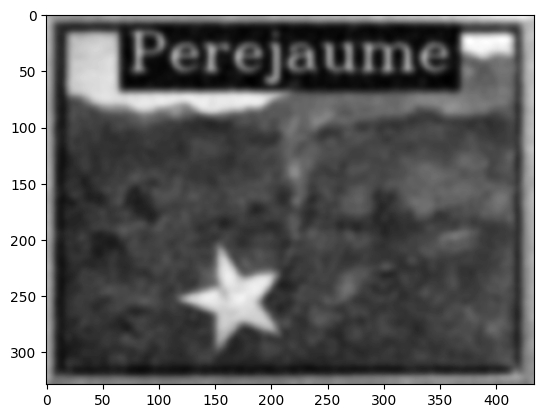

[[133 132 130 ... 170 169 168]
 [134 133 130 ... 169 167 167]
 [134 133 130 ... 165 164 163]
 ...
 [113 111 108 ... 106 109 110]
 [110 109 105 ... 105 108 109]
 [109 108 104 ... 105 108 109]]
uint8
[0.0, 3, 10]


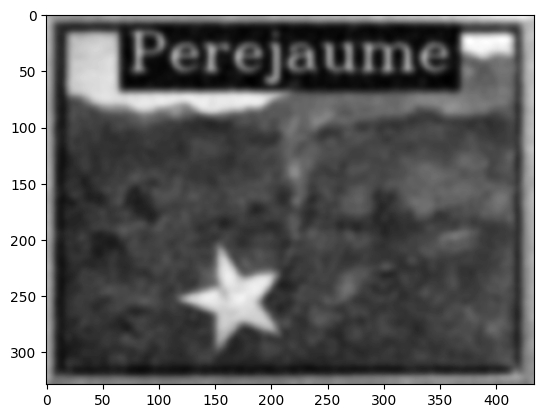

[[13 10  5 ...  0  0  0]
 [13 10  5 ...  0  0  0]
 [13 10  5 ...  0  0  0]
 ...
 [13 11  6 ...  4  6  7]
 [13 11  6 ...  4  7  7]
 [13 11  6 ...  4  7  7]]
uint8
[0.0, 5, 0.1]


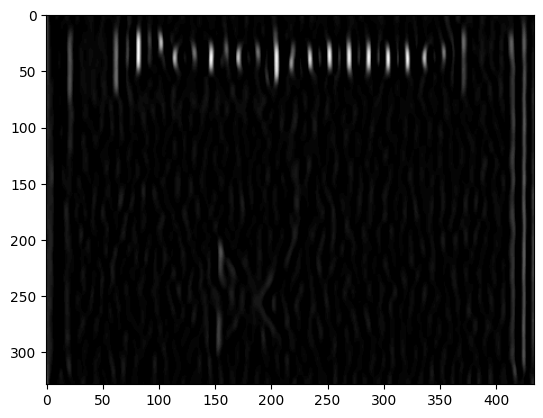

[[5 0 0 ... 0 0 0]
 [5 0 0 ... 0 0 0]
 [5 0 0 ... 0 0 0]
 ...
 [1 0 0 ... 6 0 0]
 [1 0 0 ... 6 0 0]
 [1 0 0 ... 6 0 0]]
uint8
[0.0, 5, 0.25]


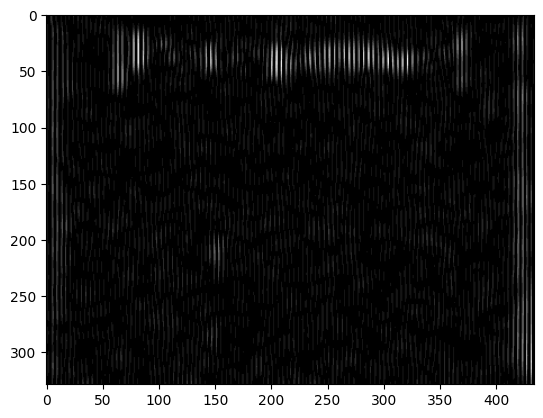

[[ 2  0  2 ...  2  0  2]
 [ 2  0  2 ...  2  0  2]
 [ 2  0  2 ...  1  0  2]
 ...
 [ 4  0  4 ...  0 11  0]
 [ 4  0  4 ...  0 12  0]
 [ 4  0  4 ...  0 12  0]]
uint8
[0.0, 5, 0.5]


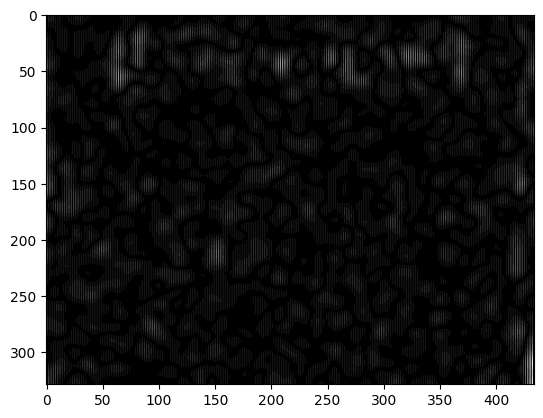

[[125 125 123 ... 160 160 160]
 [125 124 123 ... 159 159 159]
 [125 124 123 ... 158 158 158]
 ...
 [104 104 102 ... 103 104 104]
 [104 103 102 ... 103 104 104]
 [104 103 102 ... 103 104 104]]
uint8
[0.0, 5, 1]


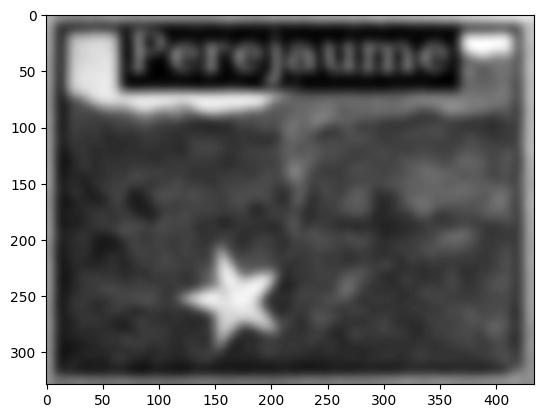

[[125 125 123 ... 160 160 160]
 [125 124 123 ... 159 159 159]
 [125 124 123 ... 158 158 158]
 ...
 [104 104 102 ... 103 104 104]
 [104 103 102 ... 103 104 104]
 [104 103 102 ... 103 104 104]]
uint8
[0.0, 5, 10]


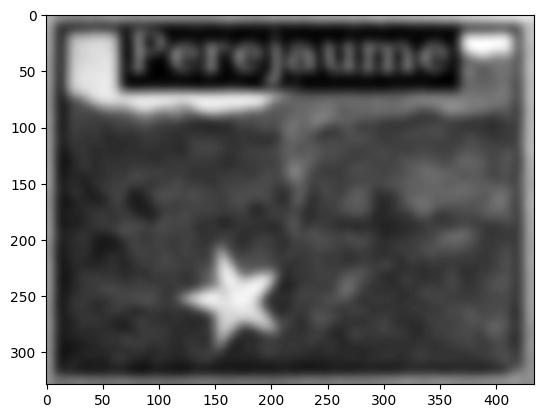

[[143 135 119 ... 158 151 155]
 [138 129 109 ... 144 144 153]
 [127 114  93 ... 128 136 145]
 ...
 [124 114  96 ... 103 112 108]
 [ 94  89  78 ...  88  99  98]
 [ 68  67  60 ...  69  81  82]]
uint8
[0.7853981633974483, 1, 0.1]


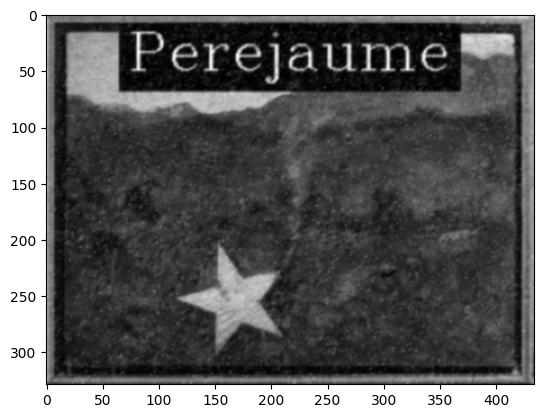

[[53 53 46 ... 64 50 58]
 [55 54 37 ... 43 44 61]
 [51 40 24 ... 35 49 58]
 ...
 [53 43 36 ... 35 46 36]
 [36 30 30 ... 34 41 36]
 [11 11 13 ... 15 20 20]]
uint8
[0.7853981633974483, 1, 0.25]


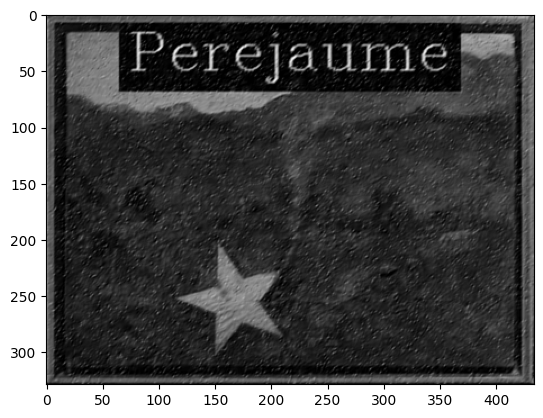

[[ 0  2  6 ... 14  0  7]
 [ 2  7  0 ...  0  0  4]
 [ 4  1  0 ...  0  7  2]
 ...
 [ 2  0  0 ...  0  9  0]
 [ 7  0 12 ...  6  6  0]
 [ 0  0  0 ...  0  0  8]]
uint8
[0.7853981633974483, 1, 0.5]


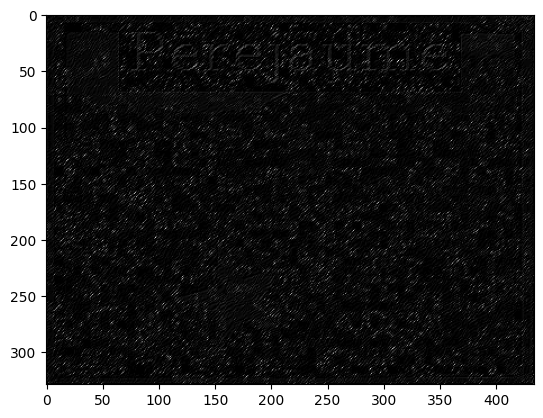

[[ 2  8 10 ... 19  0 10]
 [ 8 14  2 ...  0  0 12]
 [10  5  0 ...  0 11 10]
 ...
 [ 9  3  3 ...  0 13  0]
 [ 8  1 11 ... 10 10  3]
 [ 0  0  0 ...  0  0  3]]
uint8
[0.7853981633974483, 1, 1]


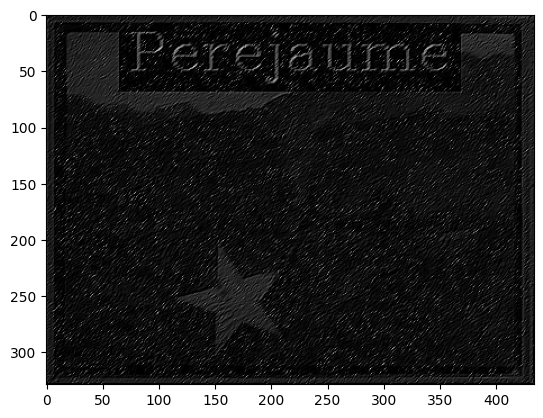

[[142 135 118 ... 158 151 155]
 [138 129 108 ... 143 144 153]
 [127 114  93 ... 127 136 145]
 ...
 [124 114  96 ... 103 112 108]
 [ 94  89  78 ...  87  99  98]
 [ 68  66  60 ...  69  81  81]]
uint8
[0.7853981633974483, 1, 10]


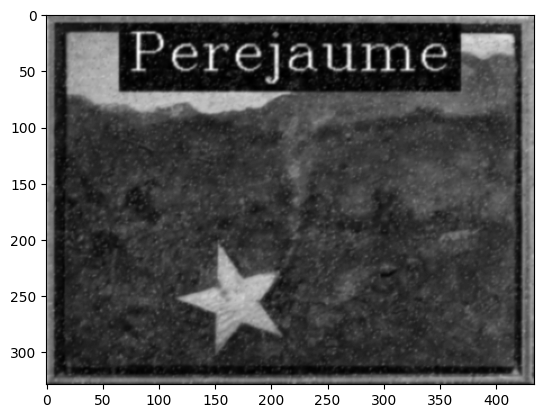

[[28 27 24 ... 34 33 33]
 [27 26 24 ... 32 32 32]
 [27 26 24 ... 29 29 30]
 ...
 [23 21 17 ... 18 22 25]
 [20 18 15 ... 18 22 24]
 [18 17 15 ... 19 22 23]]
uint8
[0.7853981633974483, 3, 0.1]


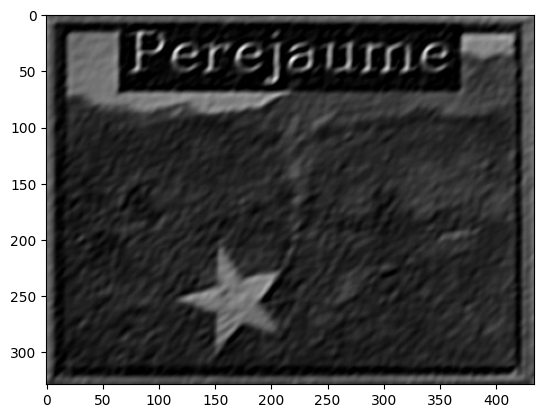

[[0 0 2 ... 3 0 0]
 [0 2 1 ... 0 0 0]
 [1 1 0 ... 0 0 4]
 ...
 [2 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 0]
 [0 0 1 ... 0 0 0]]
uint8
[0.7853981633974483, 3, 0.25]


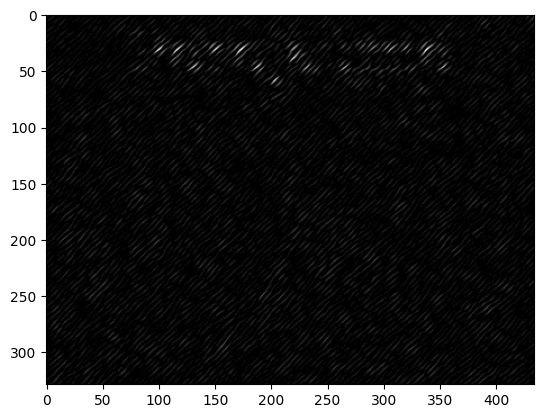

[[0 0 0 ... 1 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 1 0]
 ...
 [0 0 1 ... 0 0 0]
 [0 1 0 ... 0 0 0]
 [1 0 0 ... 0 0 0]]
uint8
[0.7853981633974483, 3, 0.5]


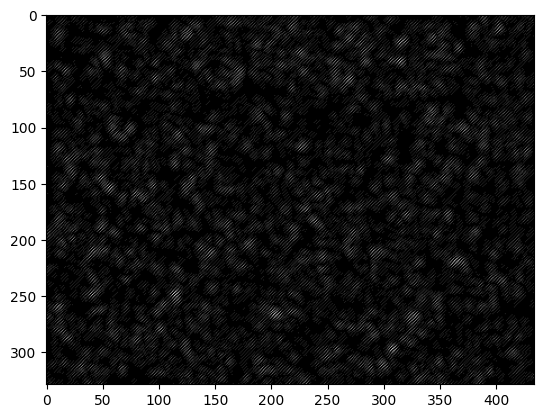

[[0 0 1 ... 3 0 0]
 [0 1 0 ... 0 0 1]
 [1 0 0 ... 0 2 1]
 ...
 [0 0 1 ... 1 0 0]
 [0 1 0 ... 1 0 0]
 [1 0 0 ... 0 0 1]]
uint8
[0.7853981633974483, 3, 1]


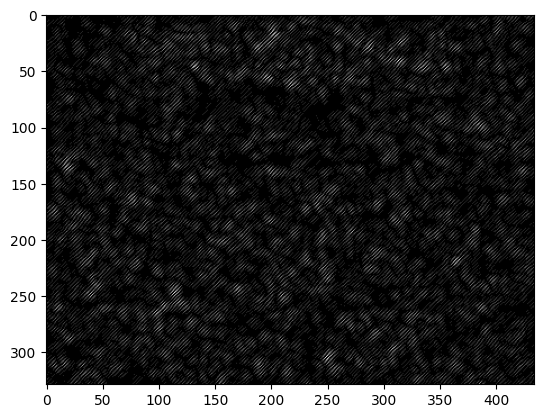

[[27 26 24 ... 33 32 32]
 [27 26 24 ... 32 31 31]
 [26 26 23 ... 29 29 29]
 ...
 [23 21 17 ... 18 22 25]
 [19 18 15 ... 18 21 24]
 [18 17 15 ... 18 22 23]]
uint8
[0.7853981633974483, 3, 10]


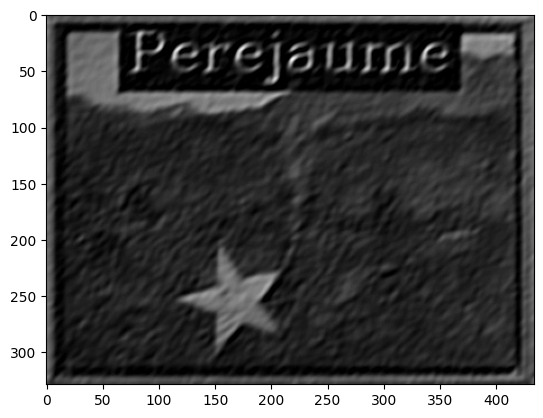

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 2 4]
 [0 0 0 ... 2 3 4]
 [0 0 0 ... 3 4 5]]
uint8
[0.7853981633974483, 5, 0.1]


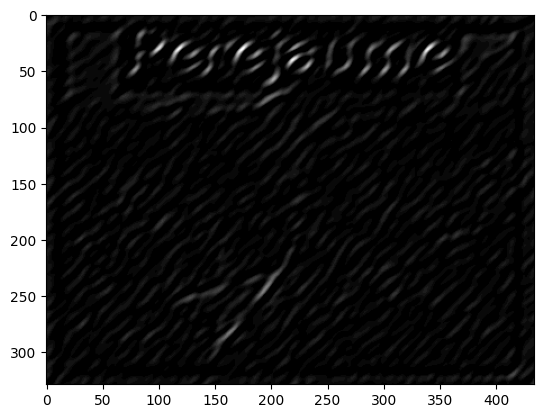

[[0 0 1 ... 2 0 0]
 [0 1 1 ... 0 0 0]
 [1 1 0 ... 0 0 2]
 ...
 [1 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
uint8
[0.7853981633974483, 5, 0.25]


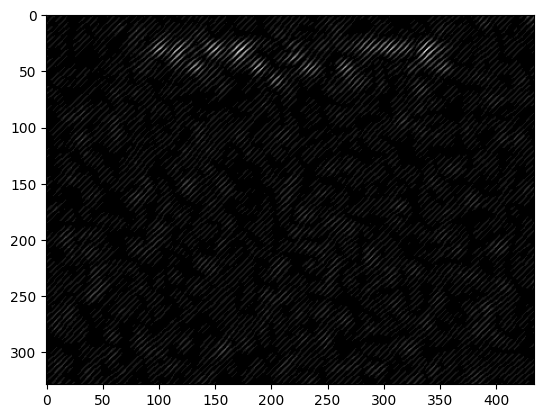

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 1 ... 0 0 0]
 [0 1 0 ... 0 0 0]
 [1 0 0 ... 0 0 0]]
uint8
[0.7853981633974483, 5, 0.5]


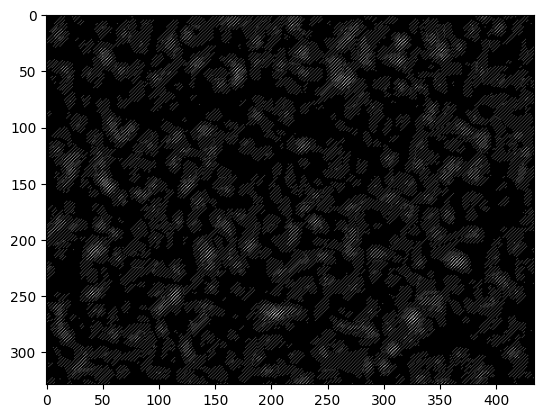

[[0 0 0 ... 2 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 1 1]
 ...
 [0 0 1 ... 1 0 0]
 [0 1 0 ... 0 0 0]
 [1 0 0 ... 0 0 0]]
uint8
[0.7853981633974483, 5, 1]


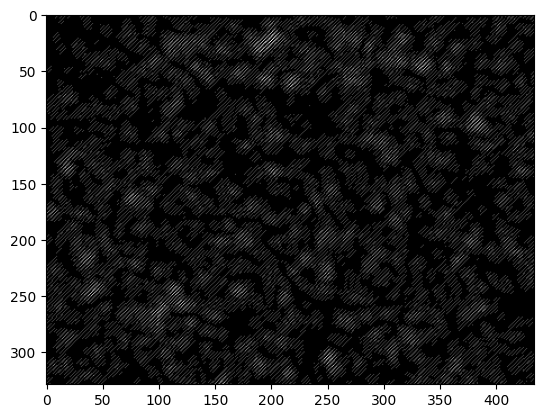

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 2 4]
 [0 0 0 ... 2 3 4]
 [0 0 0 ... 3 4 5]]
uint8
[0.7853981633974483, 5, 10]


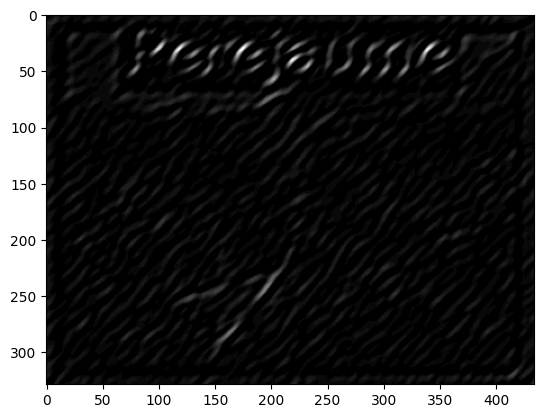

[[142 136 121 ... 161 153 155]
 [137 128 110 ... 147 147 152]
 [124 112  93 ... 128 136 143]
 ...
 [124 116  98 ... 106 113 111]
 [ 93  90  79 ...  88  99 100]
 [ 62  61  55 ...  64  75  77]]
uint8
[1.5707963267948966, 1, 0.1]


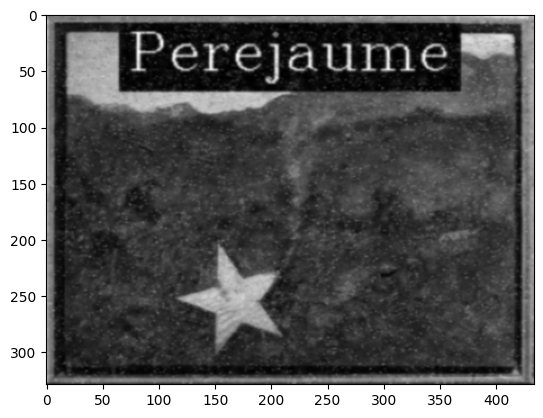

[[54 55 55 ... 72 60 56]
 [53 49 40 ... 53 54 57]
 [41 36 27 ... 36 44 49]
 ...
 [54 49 40 ... 42 46 45]
 [41 41 38 ... 42 48 49]
 [ 0  0  0 ...  0  0  0]]
uint8
[1.5707963267948966, 1, 0.25]


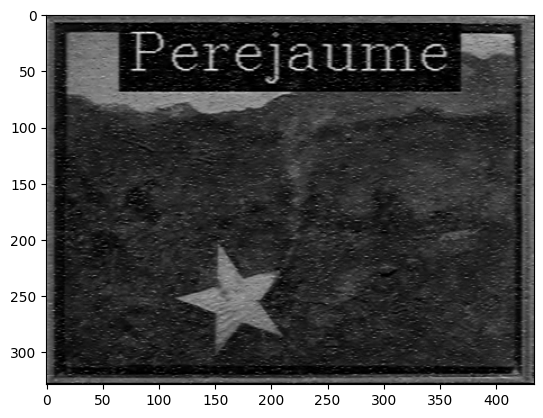

[[ 1  6 14 ... 14  4  0]
 [ 5  2  0 ...  2  6  8]
 [ 4  4  3 ...  0  0  0]
 ...
 [ 0  0  0 ...  0  0  0]
 [36 37 36 ... 37 40 39]
 [ 0  0  0 ...  0  0  0]]
uint8
[1.5707963267948966, 1, 0.5]


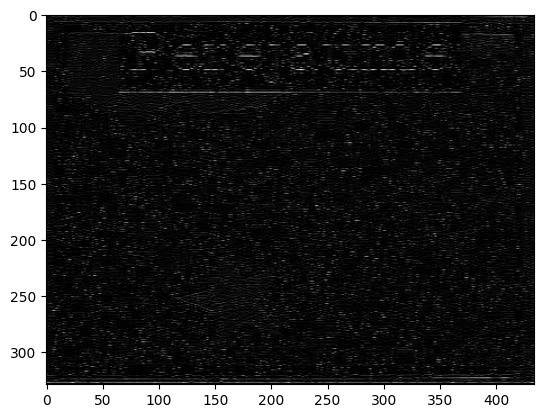

[[171 162 143 ... 190 184 187]
 [165 154 133 ... 178 178 184]
 [153 139 117 ... 159 166 174]
 ...
 [146 137 116 ... 125 134 132]
 [114 109  96 ... 106 119 119]
 [ 89  86  77 ...  88 102 104]]
uint8
[1.5707963267948966, 1, 1]


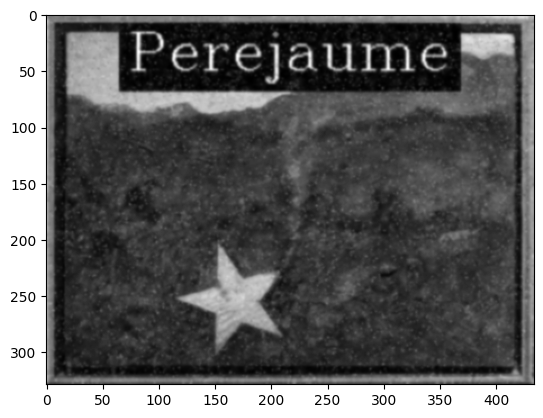

[[171 162 143 ... 190 184 187]
 [165 154 133 ... 178 178 184]
 [153 139 117 ... 159 166 174]
 ...
 [146 137 116 ... 125 134 132]
 [114 109  96 ... 106 119 119]
 [ 89  86  77 ...  88 102 104]]
uint8
[1.5707963267948966, 1, 10]


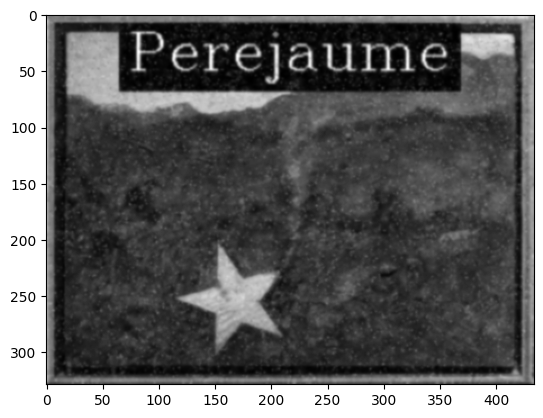

[[25 25 25 ... 43 42 42]
 [23 23 23 ... 40 40 40]
 [19 19 19 ... 35 34 34]
 ...
 [16 16 15 ... 19 19 20]
 [ 7  7  7 ... 12 13 13]
 [ 3  3  3 ...  8  9 10]]
uint8
[1.5707963267948966, 3, 0.1]


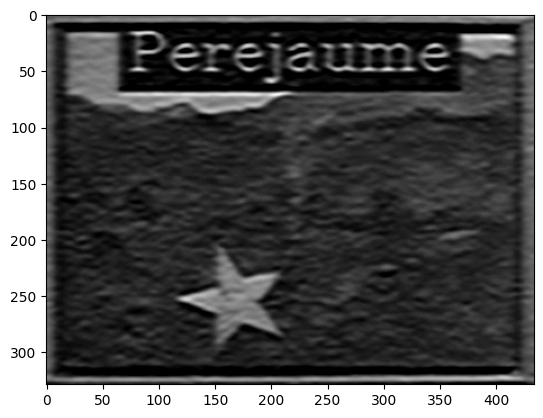

[[ 7  7  7 ...  7  7  7]
 [ 2  1  1 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [13 13 13 ... 13 12 12]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]]
uint8
[1.5707963267948966, 3, 0.25]


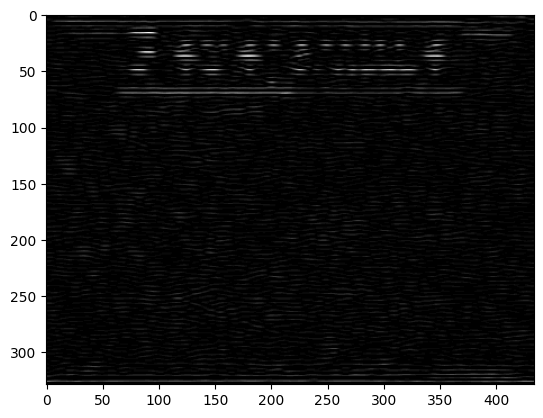

[[ 6  6  7 ...  1  0  0]
 [ 0  0  0 ...  0  0  1]
 [ 5  6  6 ...  0  0  0]
 ...
 [ 0  0  0 ...  0  0  0]
 [18 18 18 ... 13 14 14]
 [ 0  0  0 ...  0  0  0]]
uint8
[1.5707963267948966, 3, 0.5]


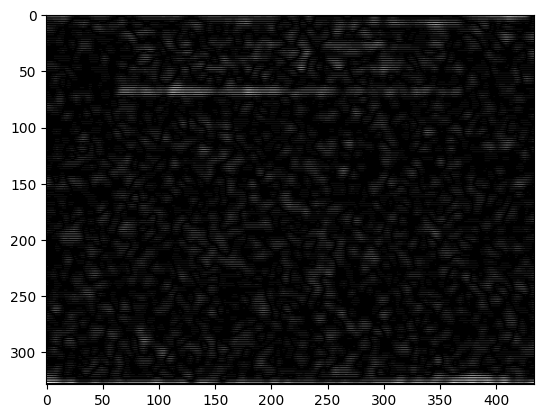

[[133 132 130 ... 170 169 168]
 [134 133 130 ... 169 167 167]
 [134 133 130 ... 165 164 163]
 ...
 [113 111 108 ... 106 109 110]
 [110 109 105 ... 105 108 109]
 [109 108 104 ... 105 108 109]]
uint8
[1.5707963267948966, 3, 1]


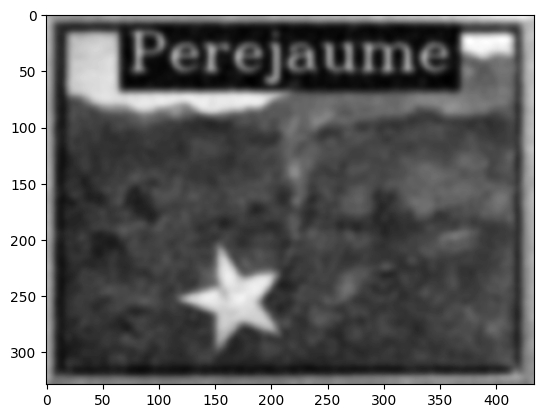

[[133 132 130 ... 170 169 168]
 [134 133 130 ... 169 167 167]
 [134 133 130 ... 165 164 163]
 ...
 [113 111 108 ... 106 109 110]
 [110 109 105 ... 105 108 109]
 [109 108 104 ... 105 108 109]]
uint8
[1.5707963267948966, 3, 10]


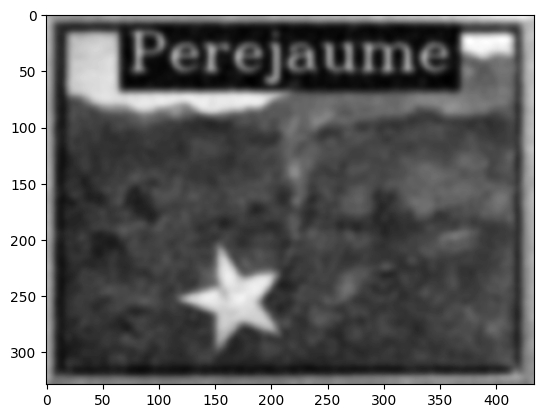

[[ 0  0  0 ... 13 13 13]
 [ 0  0  0 ... 12 12 12]
 [ 0  0  0 ...  7  7  7]
 ...
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]]
uint8
[1.5707963267948966, 5, 0.1]


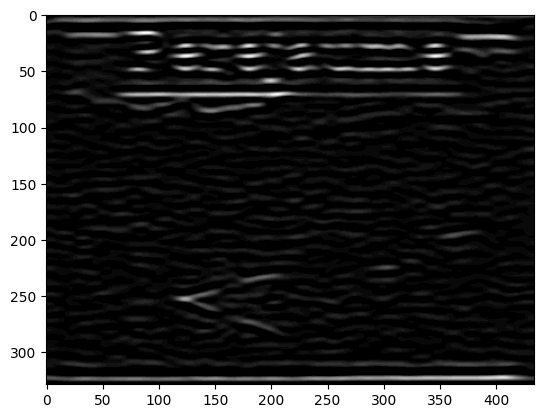

[[3 3 2 ... 3 3 3]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [8 8 8 ... 9 9 9]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
uint8
[1.5707963267948966, 5, 0.25]


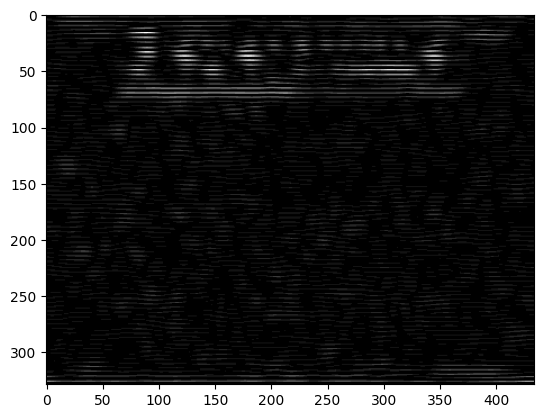

[[ 5  5  5 ...  2  2  2]
 [ 0  0  0 ...  0  0  0]
 [ 5  5  5 ...  2  2  2]
 ...
 [ 0  0  0 ...  0  0  0]
 [12 12 12 ...  7  7  7]
 [ 0  0  0 ...  0  0  0]]
uint8
[1.5707963267948966, 5, 0.5]


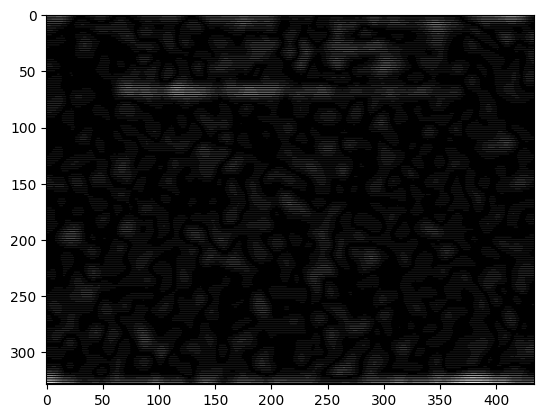

[[125 125 123 ... 160 160 160]
 [125 124 123 ... 159 159 159]
 [125 124 123 ... 158 158 158]
 ...
 [104 104 102 ... 103 104 104]
 [104 103 102 ... 103 104 104]
 [104 103 102 ... 103 104 104]]
uint8
[1.5707963267948966, 5, 1]


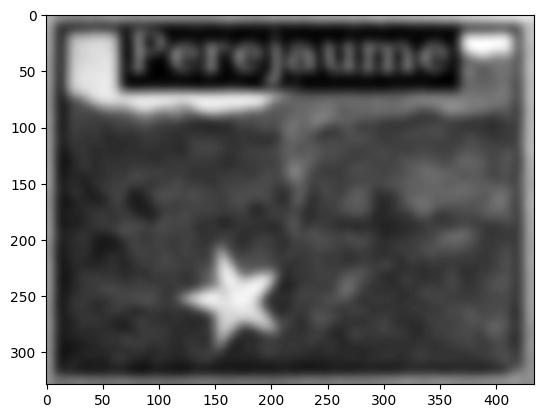

[[125 125 123 ... 160 160 160]
 [125 124 123 ... 159 159 159]
 [125 124 123 ... 158 158 158]
 ...
 [104 104 102 ... 103 104 104]
 [104 103 102 ... 103 104 104]
 [104 103 102 ... 103 104 104]]
uint8
[1.5707963267948966, 5, 10]


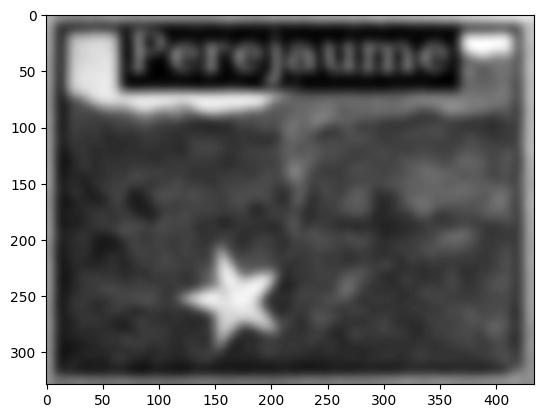

[[143 135 119 ... 158 151 155]
 [138 127 108 ... 147 147 153]
 [127 114  94 ... 129 136 145]
 ...
 [124 117  97 ... 105 114 108]
 [ 94  91  80 ...  88 100  98]
 [ 68  67  60 ...  69  81  82]]
uint8
[2.356194490192345, 1, 0.1]


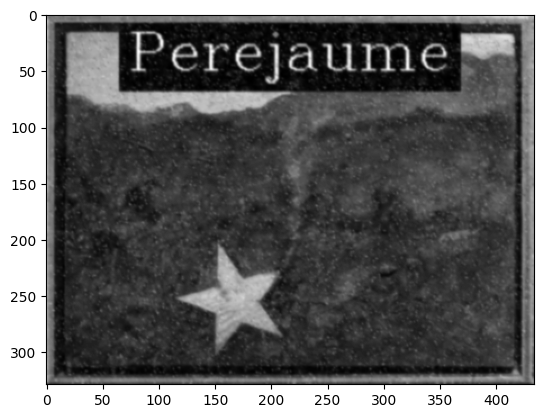

[[53 53 46 ... 64 50 58]
 [55 45 37 ... 56 56 61]
 [51 40 28 ... 41 45 58]
 ...
 [53 51 37 ... 41 52 36]
 [36 38 37 ... 32 45 36]
 [11 11 13 ... 15 20 20]]
uint8
[2.356194490192345, 1, 0.25]


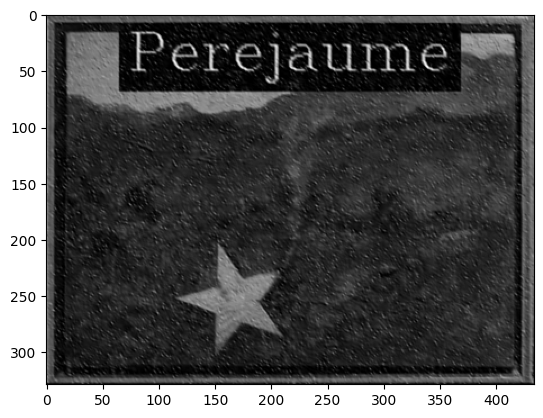

[[ 0  2  6 ... 14  0  7]
 [ 2  0  0 ...  1  6  4]
 [ 4  2  0 ...  0  2  2]
 ...
 [ 2  6  0 ...  0 11  0]
 [ 7  0 15 ...  0  9  0]
 [ 0  0  0 ...  0  0  8]]
uint8
[2.356194490192345, 1, 0.5]


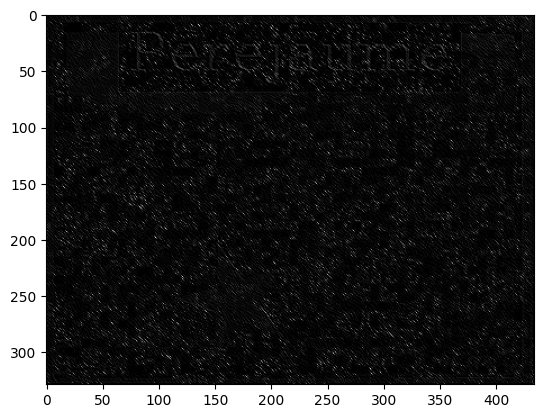

[[ 2  8 10 ... 19  0 10]
 [ 8  3  3 ...  9 11 12]
 [10  5  0 ...  0  4 10]
 ...
 [ 9 12  3 ...  0 17  0]
 [ 8  6 17 ...  3 15  3]
 [ 0  0  0 ...  0  0  3]]
uint8
[2.356194490192345, 1, 1]


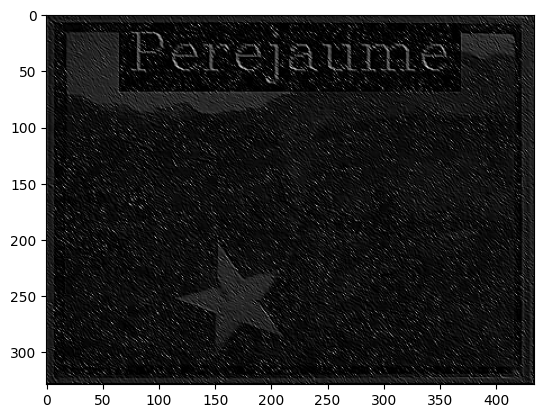

[[142 135 118 ... 158 151 155]
 [138 127 108 ... 147 147 153]
 [127 114  94 ... 129 135 145]
 ...
 [124 116  97 ... 105 114 108]
 [ 94  91  80 ...  88 100  98]
 [ 68  66  60 ...  69  81  81]]
uint8
[2.356194490192345, 1, 10]


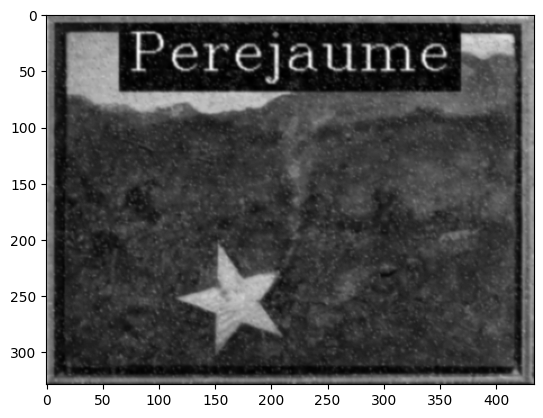

[[28 27 24 ... 34 33 33]
 [27 26 24 ... 33 32 32]
 [27 25 23 ... 31 30 30]
 ...
 [23 23 21 ... 24 26 25]
 [20 19 17 ... 21 24 24]
 [18 17 15 ... 19 22 23]]
uint8
[2.356194490192345, 3, 0.1]


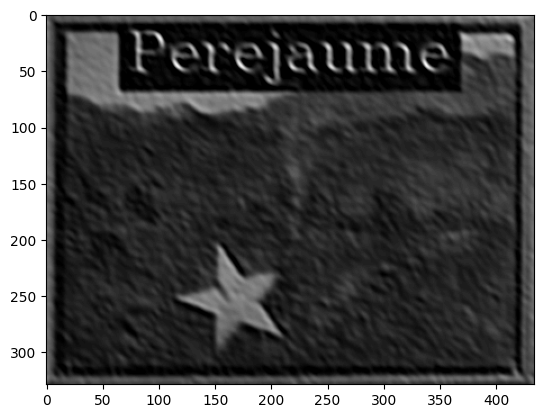

[[0 0 2 ... 3 0 0]
 [0 0 0 ... 5 3 0]
 [1 0 0 ... 2 5 4]
 ...
 [2 3 0 ... 0 0 1]
 [0 2 2 ... 0 0 0]
 [0 0 1 ... 0 0 0]]
uint8
[2.356194490192345, 3, 0.25]


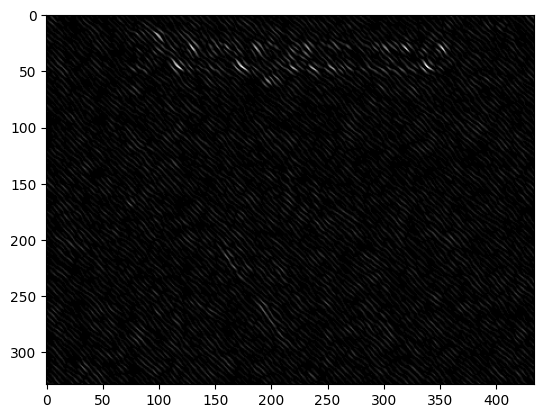

[[0 0 0 ... 1 0 0]
 [0 0 1 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 1 0 ... 0 0 0]
 [0 0 1 ... 0 0 0]
 [1 0 0 ... 0 0 0]]
uint8
[2.356194490192345, 3, 0.5]


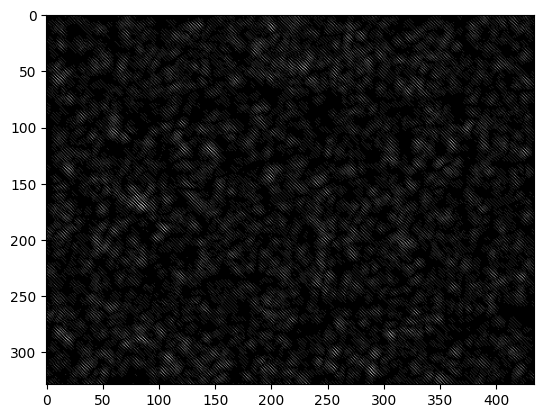

[[0 0 1 ... 3 0 0]
 [0 0 1 ... 0 2 1]
 [1 0 0 ... 0 0 1]
 ...
 [0 2 0 ... 1 1 0]
 [0 0 1 ... 0 1 0]
 [1 0 0 ... 0 0 1]]
uint8
[2.356194490192345, 3, 1]


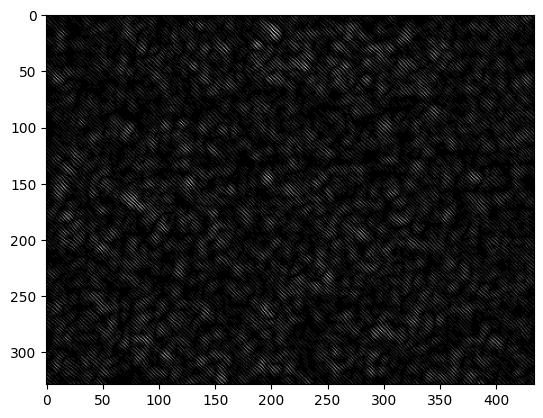

[[27 26 24 ... 33 32 32]
 [27 26 23 ... 33 32 31]
 [26 25 22 ... 31 30 29]
 ...
 [23 23 21 ... 24 25 25]
 [19 19 17 ... 21 23 24]
 [18 17 15 ... 18 22 23]]
uint8
[2.356194490192345, 3, 10]


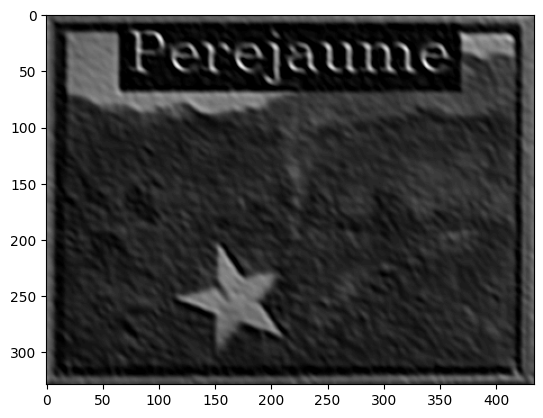

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 1 0 0]
 [0 0 0 ... 1 0 0]
 ...
 [0 0 0 ... 4 4 4]
 [0 0 0 ... 4 5 4]
 [0 0 0 ... 3 4 5]]
uint8
[2.356194490192345, 5, 0.1]


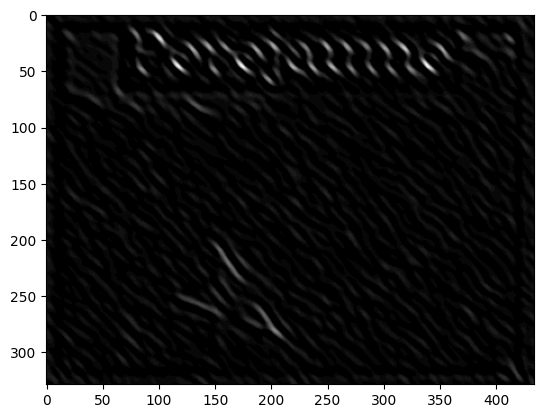

[[0 0 1 ... 2 0 0]
 [0 0 0 ... 3 2 0]
 [1 0 0 ... 1 4 2]
 ...
 [1 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
uint8
[2.356194490192345, 5, 0.25]


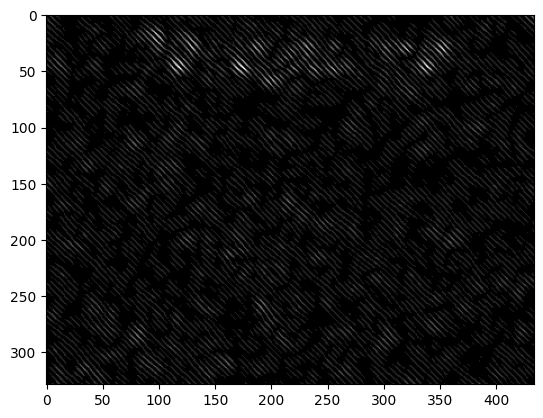

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 1 0 ... 0 0 0]
 [0 0 1 ... 0 0 0]
 [1 0 0 ... 0 0 0]]
uint8
[2.356194490192345, 5, 0.5]


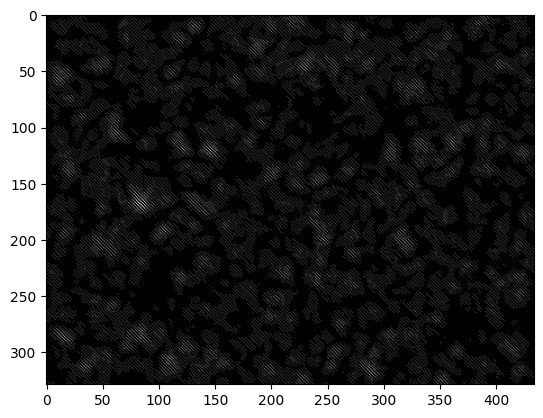

[[0 0 0 ... 2 0 0]
 [0 0 0 ... 0 1 0]
 [0 0 0 ... 0 0 1]
 ...
 [0 1 0 ... 0 0 0]
 [0 0 1 ... 0 0 0]
 [1 0 0 ... 0 0 0]]
uint8
[2.356194490192345, 5, 1]


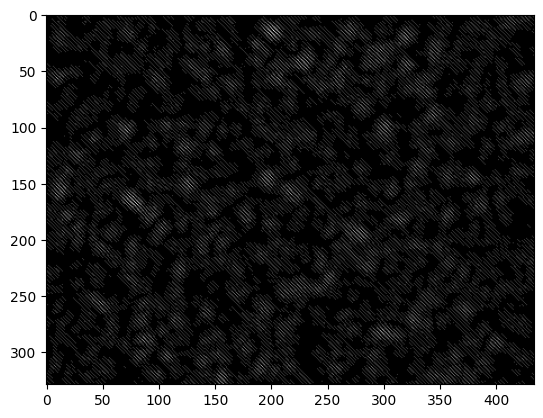

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 1 0 0]
 [0 0 0 ... 1 0 0]
 ...
 [0 0 0 ... 4 4 4]
 [0 0 0 ... 3 4 4]
 [0 0 0 ... 3 4 5]]
uint8
[2.356194490192345, 5, 10]


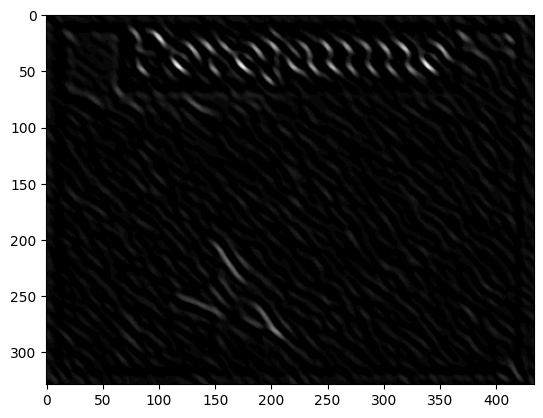

In [116]:
kernels = []
for i_theta in range(4):
    theta = i_theta * np.pi / 4
    for sigma in (1, 3, 5):
        for frequency in (0.1, 0.25, 0.5, 1, 10):
            kernel = np.real(gabor_kernel(frequency, theta=theta,
                                          sigma_x=sigma, sigma_y=sigma))
            kernels.append(([theta, sigma, frequency], kernel))

for kernel in kernels:
    filtered = cv2.filter2D(test_img[..., 0], -1, kernel[1])
    print(filtered)
    print(filtered.dtype)
    plt.imshow(filtered, cmap=plt.colormaps.get_cmap('gray'))
    print(kernel[0])
    plt.show()

[0.0, 1, 0.1]


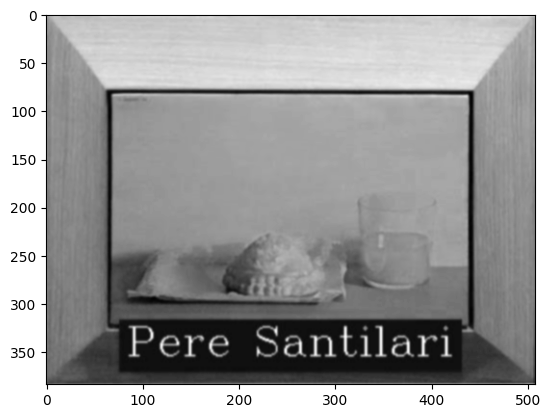

[0.0, 1, 0.25]


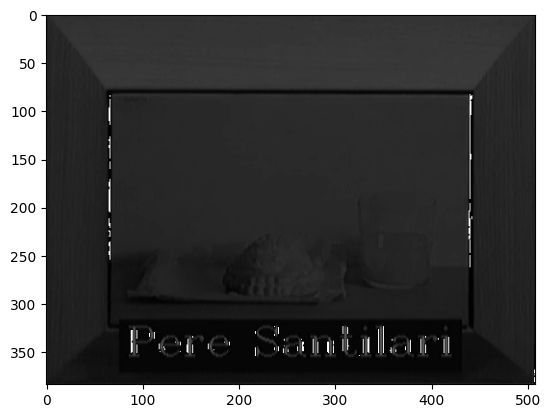

[0.0, 1, 0.5]


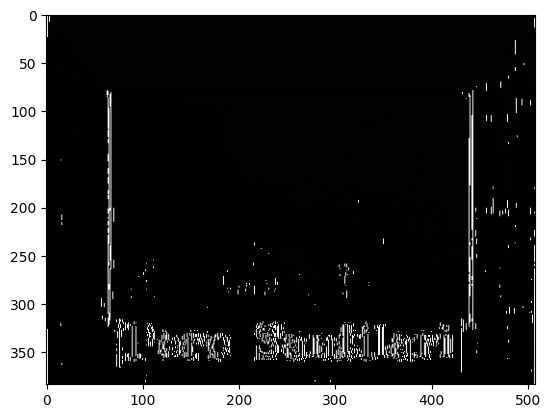

[0.0, 3, 0.1]


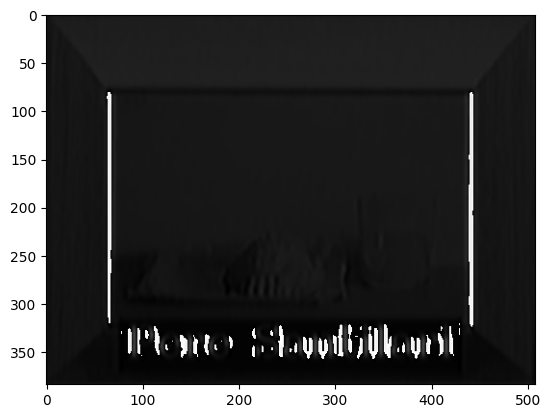

[0.0, 3, 0.25]


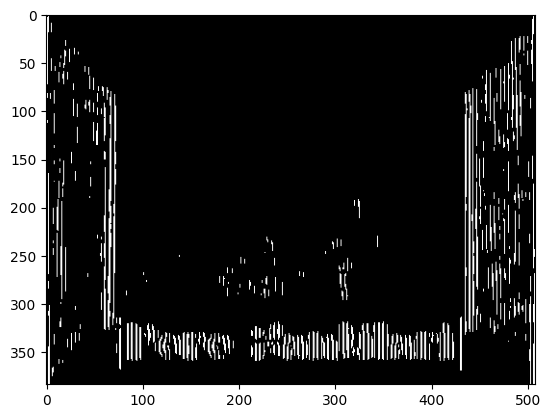

[0.0, 3, 0.5]


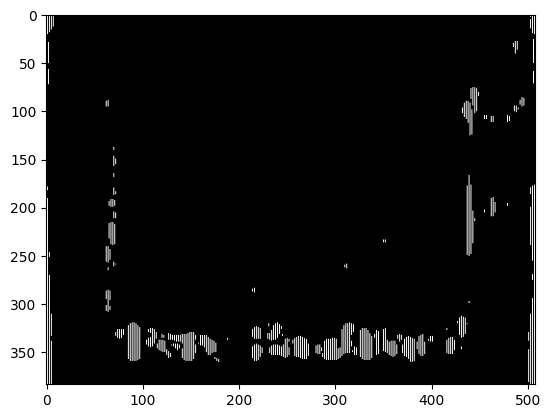

[0.0, 5, 0.1]


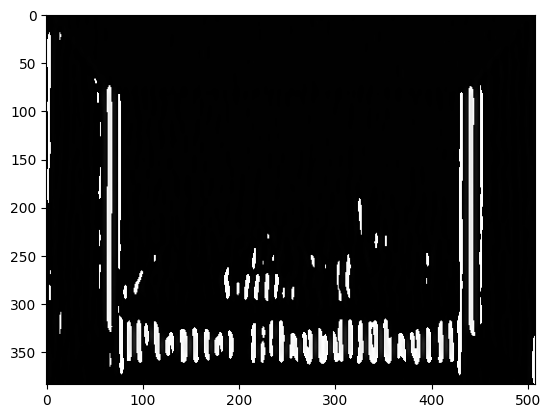

[0.0, 5, 0.25]


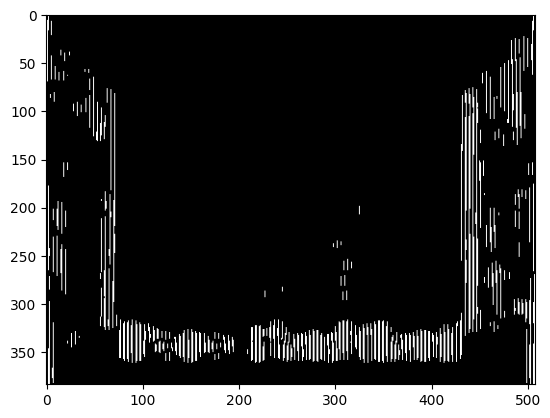

[0.0, 5, 0.5]


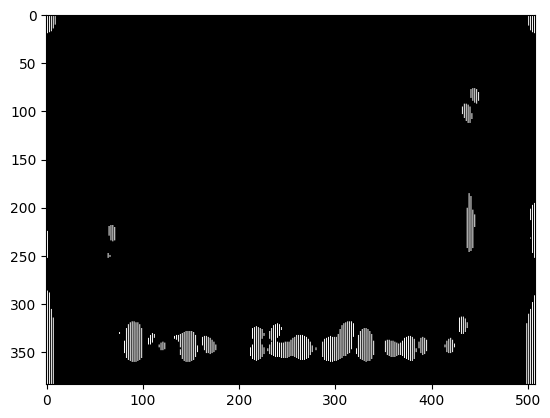

[0.7853981633974483, 1, 0.1]


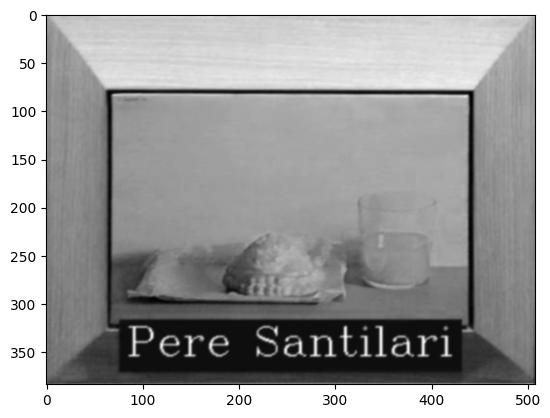

[0.7853981633974483, 1, 0.25]


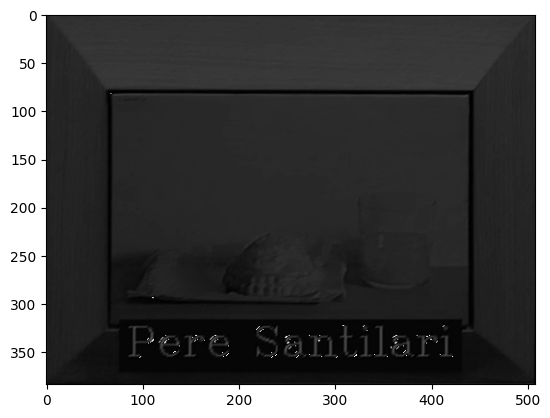

[0.7853981633974483, 1, 0.5]


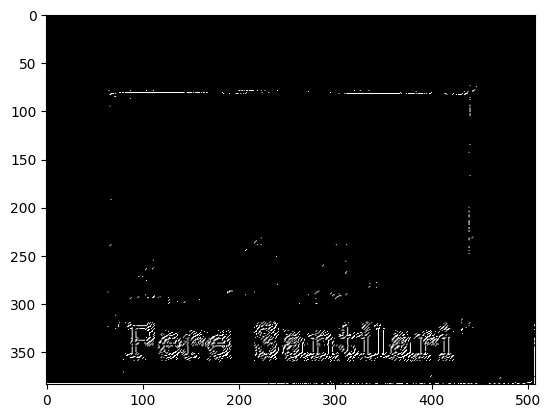

[0.7853981633974483, 3, 0.1]


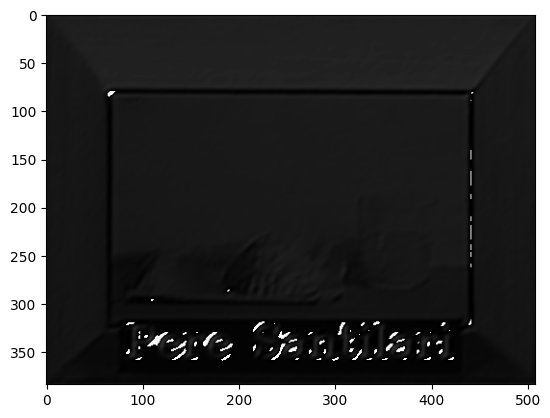

[0.7853981633974483, 3, 0.25]


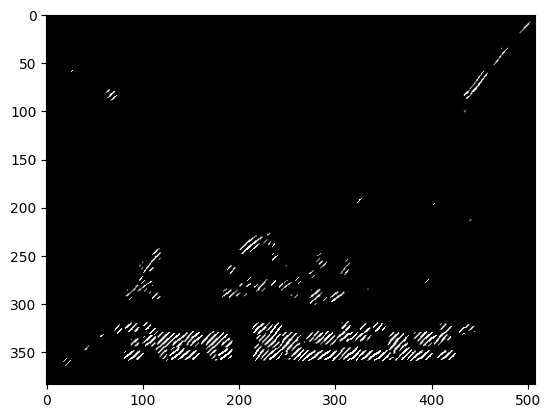

[0.7853981633974483, 3, 0.5]


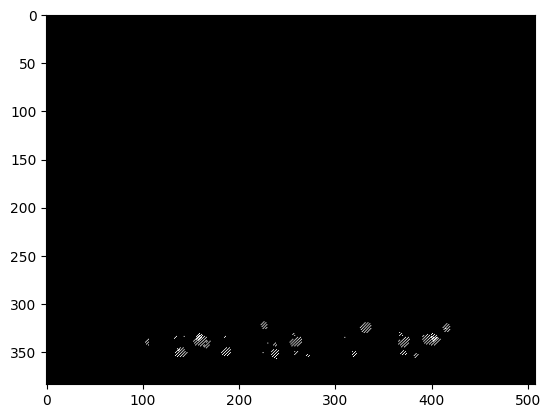

[0.7853981633974483, 5, 0.1]


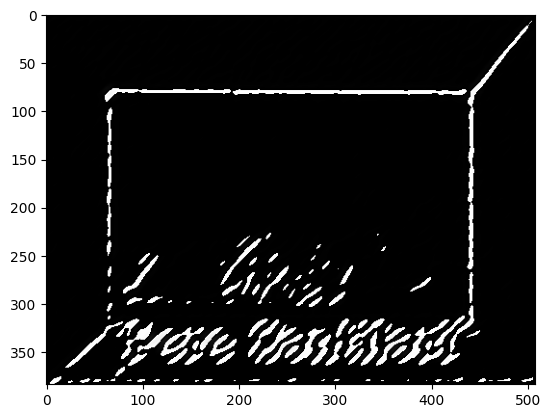

[0.7853981633974483, 5, 0.25]


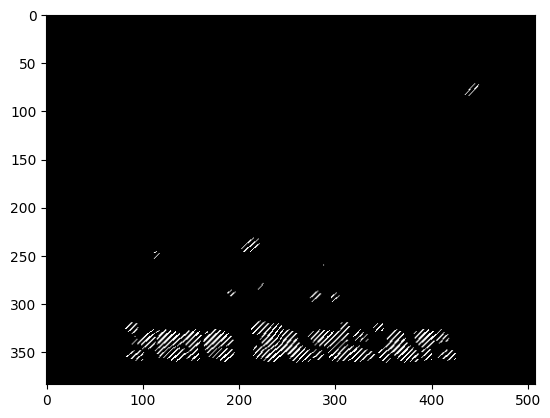

[0.7853981633974483, 5, 0.5]


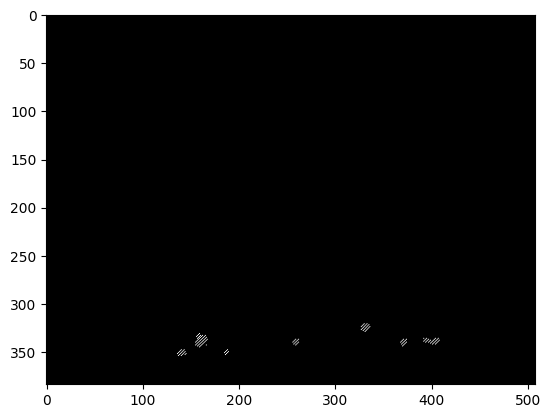

[1.5707963267948966, 1, 0.1]


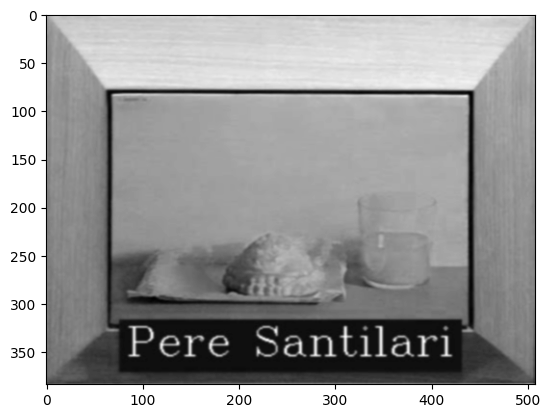

[1.5707963267948966, 1, 0.25]


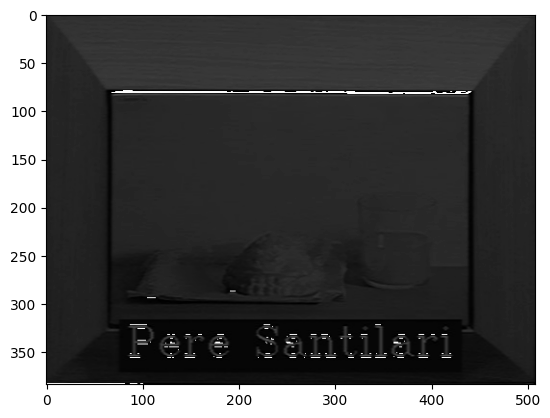

[1.5707963267948966, 1, 0.5]


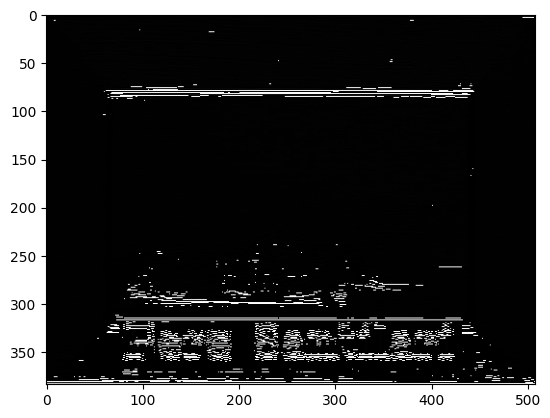

[1.5707963267948966, 3, 0.1]


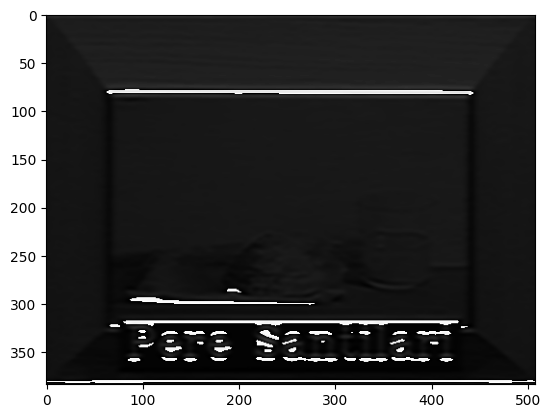

[1.5707963267948966, 3, 0.25]


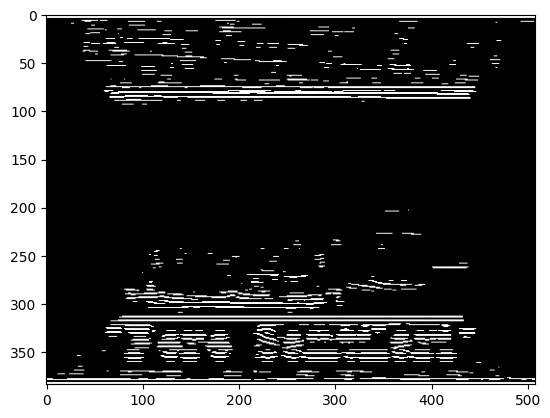

[1.5707963267948966, 3, 0.5]


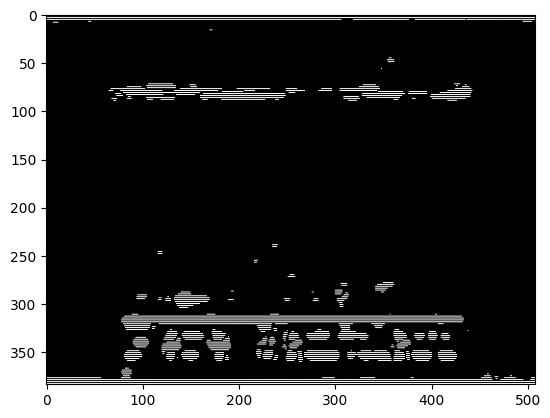

[1.5707963267948966, 5, 0.1]


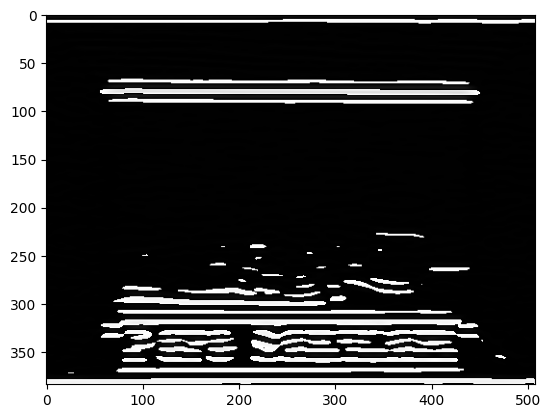

[1.5707963267948966, 5, 0.25]


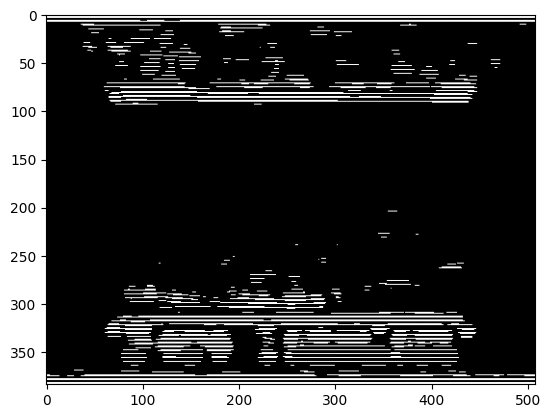

[1.5707963267948966, 5, 0.5]


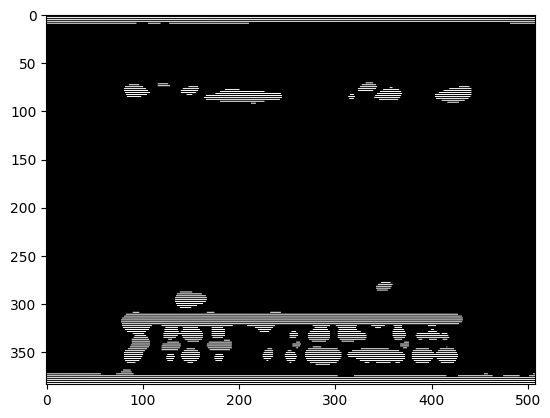

[2.356194490192345, 1, 0.1]


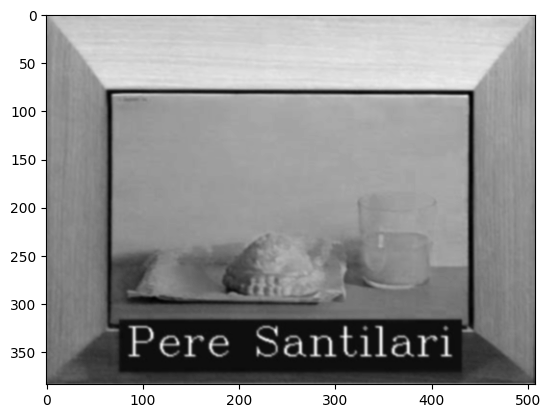

[2.356194490192345, 1, 0.25]


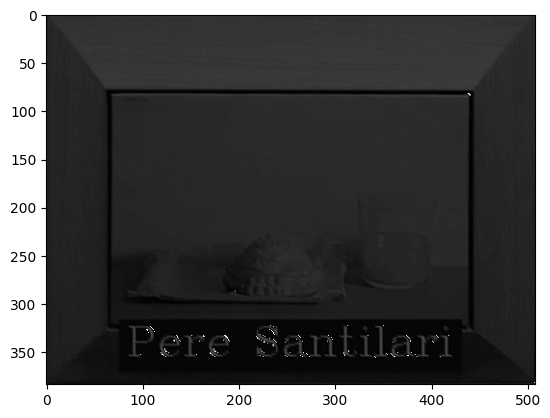

[2.356194490192345, 1, 0.5]


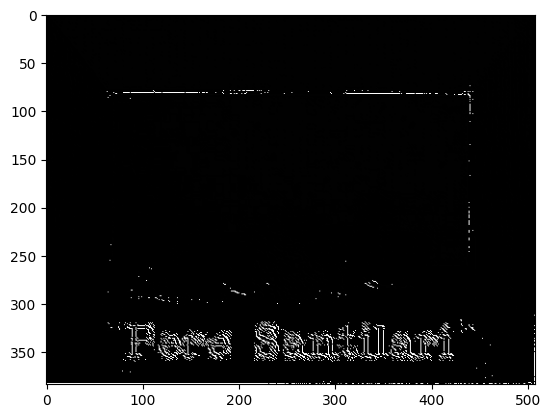

[2.356194490192345, 3, 0.1]


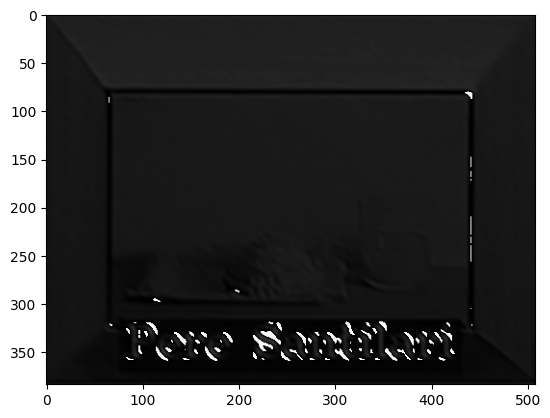

[2.356194490192345, 3, 0.25]


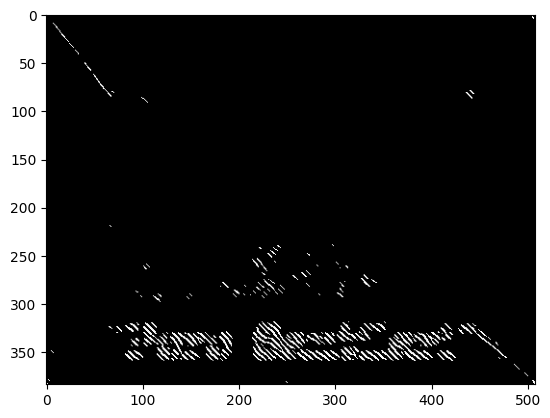

[2.356194490192345, 3, 0.5]


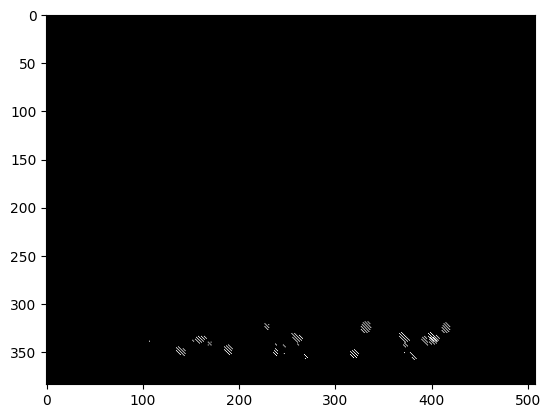

[2.356194490192345, 5, 0.1]


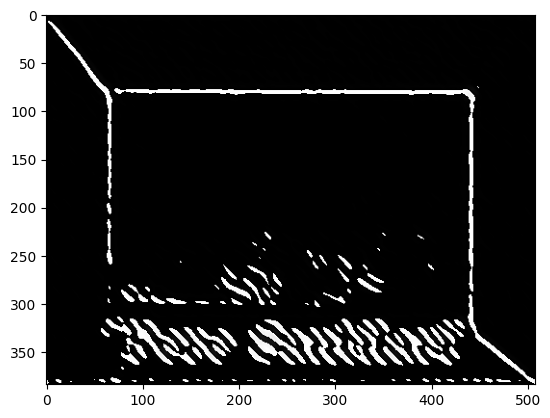

[2.356194490192345, 5, 0.25]


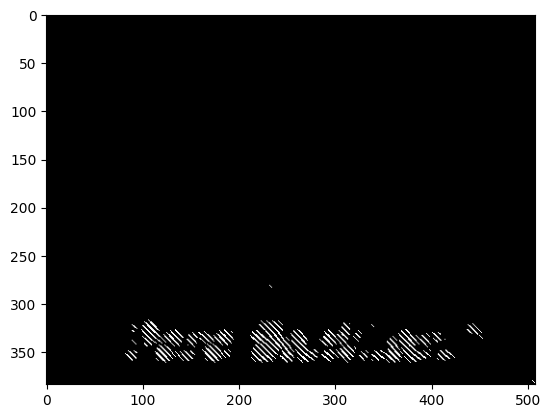

[2.356194490192345, 5, 0.5]


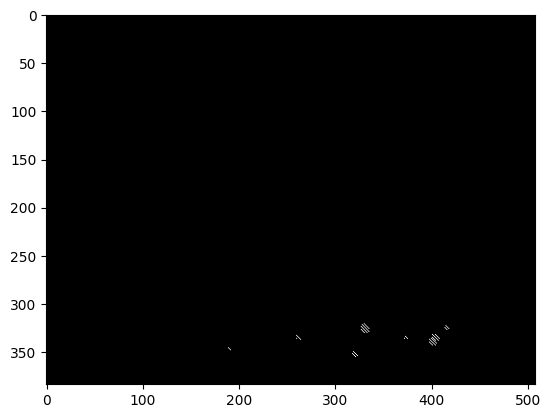

In [50]:
kernels = []
for i_theta in range(4):
    theta = i_theta * np.pi / 4
    for sigma in (1, 3, 5):
        for frequency in (0.1, 0.25, 0.5):
            kernel = np.real(gabor_kernel(frequency, theta=theta,
                                          sigma_x=sigma, sigma_y=sigma))
            kernels.append(([theta, sigma, frequency], kernel))

for kernel in kernels:
    filtered = ndi.convolve(test_img[..., 0], kernel[1], mode='wrap')
    plt.imshow(filtered, cmap=plt.colormaps.get_cmap('gray'))
    print(kernel[0])
    plt.show()

## LBP with denoising

In [90]:
# Denoising and 5 tiles

descriptor_db = {}
#for file in utils.read_bbdd('../data/BBDD/'):
#    grscl_img = convert_to_greyscale(np.array(Image.open(file)))
#    descriptor_db[file.name] = get_multitile_LBP_descriptor(grscl_img, 5)
#    print(file)
#with open('../data/BBDD/descriptors/lbp_multi_5.pkl', 'wb') as f:
#    pickle.dump(descriptor_db, f)
with open('../data/BBDD/descriptors/lbp_multi_5.pkl', 'rb') as f:
    descriptor_db = pickle.load(f)

query_descriptors = {}
for img_path in Path('../data/qsd1_w3/').glob('*.jpg'):
    image = np.array(Image.open(img_path))
    grscl_image = convert_to_greyscale(image)
    if estimate_noise(grscl_image) > 1:
        image = CDenoissing(image)
        grscl_image = convert_to_greyscale(image)
    query_descriptors[img_path.name] = get_multitile_LBP_descriptor(grscl_image, 5)
    print(img_path)

response = pipelines.generate_K_response(descriptors_bdr=descriptor_db, descriptors_queries=query_descriptors, sim_func=retrieval_distances.histogram_intersection, k=10)
print(f'mAP@10: {retrieval_metrics.mapk(gt, response, k=10)}')
print(f'mAP@5: {retrieval_metrics.mapk(gt, response, k=5)}')
print(f'mAP@1: {retrieval_metrics.mapk(gt, response, k=1)}')

..\data\qsd1_w3\00000.jpg
..\data\qsd1_w3\00001.jpg
..\data\qsd1_w3\00002.jpg
..\data\qsd1_w3\00003.jpg
..\data\qsd1_w3\00004.jpg
..\data\qsd1_w3\00005.jpg
..\data\qsd1_w3\00006.jpg
..\data\qsd1_w3\00007.jpg
..\data\qsd1_w3\00008.jpg
..\data\qsd1_w3\00009.jpg
..\data\qsd1_w3\00010.jpg
..\data\qsd1_w3\00011.jpg
..\data\qsd1_w3\00012.jpg
..\data\qsd1_w3\00013.jpg
..\data\qsd1_w3\00014.jpg
..\data\qsd1_w3\00015.jpg
..\data\qsd1_w3\00016.jpg
..\data\qsd1_w3\00017.jpg
..\data\qsd1_w3\00018.jpg
..\data\qsd1_w3\00019.jpg
..\data\qsd1_w3\00020.jpg
..\data\qsd1_w3\00021.jpg
..\data\qsd1_w3\00022.jpg
..\data\qsd1_w3\00023.jpg
..\data\qsd1_w3\00024.jpg
..\data\qsd1_w3\00025.jpg
..\data\qsd1_w3\00026.jpg
..\data\qsd1_w3\00027.jpg
..\data\qsd1_w3\00028.jpg
..\data\qsd1_w3\00029.jpg
mAP@10: 0.15587301587301586
mAP@5: 0.1511111111111111
mAP@1: 0.13333333333333333


In [91]:
# No denoising 5 tiles

with open('../data/BBDD/descriptors/lbp_multi_5.pkl', 'rb') as f:
    descriptor_db = pickle.load(f)

query_descriptors = {}
for img_path in Path('../data/qsd1_w3/').glob('*.jpg'):
    image = np.array(Image.open(img_path))
    grscl_image = convert_to_greyscale(image)
    query_descriptors[img_path.name] = get_multitile_LBP_descriptor(grscl_image, 5)
    print(img_path)

response = pipelines.generate_K_response(descriptors_bdr=descriptor_db, descriptors_queries=query_descriptors, sim_func=retrieval_distances.histogram_intersection, k=10)
print(f'mAP@10: {retrieval_metrics.mapk(gt, response, k=10)}')
print(f'mAP@5: {retrieval_metrics.mapk(gt, response, k=5)}')
print(f'mAP@1: {retrieval_metrics.mapk(gt, response, k=1)}')

..\data\qsd1_w3\00000.jpg
..\data\qsd1_w3\00001.jpg
..\data\qsd1_w3\00002.jpg
..\data\qsd1_w3\00003.jpg
..\data\qsd1_w3\00004.jpg
..\data\qsd1_w3\00005.jpg
..\data\qsd1_w3\00006.jpg
..\data\qsd1_w3\00007.jpg
..\data\qsd1_w3\00008.jpg
..\data\qsd1_w3\00009.jpg
..\data\qsd1_w3\00010.jpg
..\data\qsd1_w3\00011.jpg
..\data\qsd1_w3\00012.jpg
..\data\qsd1_w3\00013.jpg
..\data\qsd1_w3\00014.jpg
..\data\qsd1_w3\00015.jpg
..\data\qsd1_w3\00016.jpg
..\data\qsd1_w3\00017.jpg
..\data\qsd1_w3\00018.jpg
..\data\qsd1_w3\00019.jpg
..\data\qsd1_w3\00020.jpg
..\data\qsd1_w3\00021.jpg
..\data\qsd1_w3\00022.jpg
..\data\qsd1_w3\00023.jpg
..\data\qsd1_w3\00024.jpg
..\data\qsd1_w3\00025.jpg
..\data\qsd1_w3\00026.jpg
..\data\qsd1_w3\00027.jpg
..\data\qsd1_w3\00028.jpg
..\data\qsd1_w3\00029.jpg
mAP@10: 0.2784126984126984
mAP@5: 0.2577777777777778
mAP@1: 0.23333333333333334


In [92]:
# No denoising 3 tiles

descriptor_db = {}
#for file in utils.read_bbdd('../data/BBDD/'):
#    grscl_img = convert_to_greyscale(np.array(Image.open(file)))
#    descriptor_db[file.name] = get_multitile_LBP_descriptor(grscl_img)
#    print(file)
#with open('../data/BBDD/descriptors/lbp_multi_3.pkl', 'wb') as f:
#    pickle.dump(descriptor_db, f)
with open('../data/BBDD/descriptors/lbp_multi_3.pkl', 'rb') as f:
    descriptor_db = pickle.load(f)

query_descriptors = {}
for img_path in Path('../data/qsd1_w3/').glob('*.jpg'):
    image = np.array(Image.open(img_path))
    grscl_image = convert_to_greyscale(image)
    query_descriptors[img_path.name] = get_multitile_LBP_descriptor(grscl_image)
    print(img_path)

response = pipelines.generate_K_response(descriptors_bdr=descriptor_db, descriptors_queries=query_descriptors, sim_func=retrieval_distances.histogram_intersection, k=10)
print(f'mAP@10: {retrieval_metrics.mapk(gt, response, k=10)}')
print(f'mAP@5: {retrieval_metrics.mapk(gt, response, k=5)}')
print(f'mAP@1: {retrieval_metrics.mapk(gt, response, k=1)}')

..\data\qsd1_w3\00000.jpg
..\data\qsd1_w3\00001.jpg
..\data\qsd1_w3\00002.jpg
..\data\qsd1_w3\00003.jpg
..\data\qsd1_w3\00004.jpg
..\data\qsd1_w3\00005.jpg
..\data\qsd1_w3\00006.jpg
..\data\qsd1_w3\00007.jpg
..\data\qsd1_w3\00008.jpg
..\data\qsd1_w3\00009.jpg
..\data\qsd1_w3\00010.jpg
..\data\qsd1_w3\00011.jpg
..\data\qsd1_w3\00012.jpg
..\data\qsd1_w3\00013.jpg
..\data\qsd1_w3\00014.jpg
..\data\qsd1_w3\00015.jpg
..\data\qsd1_w3\00016.jpg
..\data\qsd1_w3\00017.jpg
..\data\qsd1_w3\00018.jpg
..\data\qsd1_w3\00019.jpg
..\data\qsd1_w3\00020.jpg
..\data\qsd1_w3\00021.jpg
..\data\qsd1_w3\00022.jpg
..\data\qsd1_w3\00023.jpg
..\data\qsd1_w3\00024.jpg
..\data\qsd1_w3\00025.jpg
..\data\qsd1_w3\00026.jpg
..\data\qsd1_w3\00027.jpg
..\data\qsd1_w3\00028.jpg
..\data\qsd1_w3\00029.jpg
mAP@10: 0.22392857142857145
mAP@5: 0.20833333333333334
mAP@1: 0.16666666666666666


## Gabor with denoising

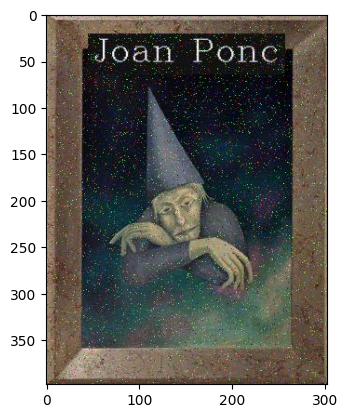

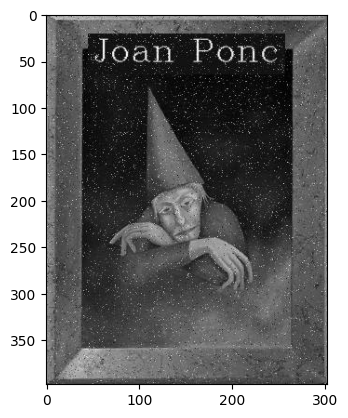

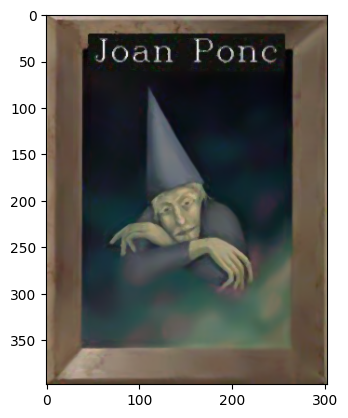

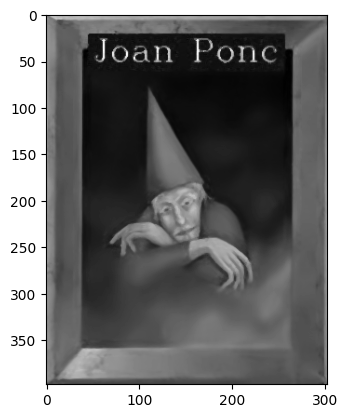

In [98]:
image = np.array(Image.open('../data/qsd1_w3/00001.jpg'))
plt.imshow(image)
plt.show()
grscl_image = convert_to_greyscale(image)
plt.imshow(grscl_image, cmap=plt.colormaps.get_cmap('gray'))
plt.show()
if estimate_noise(grscl_image) > 1:
    image = CDenoissing(image)
    plt.imshow(image)
    plt.show()
    plt.imshow(convert_to_greyscale(image), cmap=plt.colormaps.get_cmap('gray'))
    plt.show()